## Spacial patterns of crimes and their drivers: evidence from London 

In [1]:
import pandas as pd
from pathlib import Path
from stargazer.stargazer import Stargazer
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt

### Structure of the logic in the article

In general, the theme is what are the contributors of crime at LSOA level. 

it could be spacial reasons. for instance, via neighbourhood spiill-over effects. or it could be due to individual-specific factors. So you explore both possiblities in the following way. 

1. first, empircally observe spacial correlation between lsoas within London. You found that there is no strong correlation. 
  - but many people, or many discussion may have thought that crime by in large is a spacial issue, and has strong spacial patterns. for instance, people believe that crime is spacially contagious, i.e. if crime in neighbourhoods is high, more likely have crimes in your area. 

2. second, ask what are the drivers of crime rates at the individual lsoa level. to put it differently, what lsoa specific characteristics can explain the heterogeneity in crime rates, even between regions that are spacially close.

  - some of the variables are directly observable at lsoa level.
  - some of the variables are only available at bourough level.
  - both types of variations can be used to explain the differences in crime rates. 
  - but if you want to control for bourough fixed effects, those variables that are only available at bourough levels are naturally dropped becasue the bourough fixed effects already contain them. 
  

### Questions to ask

 1. justify the reason of studying the spatial correlation


### crime data 

In [2]:
crime_ipath = Path("../data/london-data-main/data/crime/")
historic_fp = crime_ipath/"MPS LSOA Level Crime (Historical).csv"
#current_fp = crime_ipath/"MPS LSOA Level Crime (most recent 24 months).csv"

historic_df = pd.read_csv(historic_fp)
#current_df = pd.read_csv(current_fp)

In [3]:
historic_df.columns

Index(['LSOA Code', 'LSOA Name', 'Borough', 'Major Category', 'Minor Category',
       '201903', '201904', '201905', '201906', '201907',
       ...
       '202006', '202007', '202008', '202009', '202010', '202011', '202012',
       '202101', '202102', '202103'],
      dtype='object', length=137)

In [4]:
### get average crime rate of each place 
to_exclude = ['LSOA Code',
             'LSOA Name',
             'Borough',
             'Major Category',
             'Minor Category']

all_dates = [var_name for var_name in historic_df.columns if var_name not in to_exclude]

In [5]:
## compute summary stats across time 

#only count 2011

dates2011 = [date for date in historic_df.columns if '2011' in date]

historic_df['crime2011'] = historic_df[dates2011].sum(axis=1)

#historic_df['sample_average_crime'] = historic_df[all_dates].mean(axis=1) ## or use median or sum 
#current_df['sample_average_crime'] =historic_df[all_dates].mean(axis=1)

historic_df = historic_df[['LSOA Code','LSOA Name','Borough','Major Category','Minor Category','crime2011']]

In [6]:
historic_df.columns

Index(['LSOA Code', 'LSOA Name', 'Borough', 'Major Category', 'Minor Category',
       'crime2011'],
      dtype='object')

In [7]:
historic_df[['LSOA Code', 'LSOA Name','Borough', 'Major Category', 'Minor Category', 'crime2011']]

,LSOA Code,LSOA Name,Borough,Major Category,Minor Category,crime2011
0,E01000006,Barking and Dagenham 016A,Barking and Dagenham,Arson and Criminal Damage,Arson,0
1,E01000006,Barking and Dagenham 016A,Barking and Dagenham,Arson and Criminal Damage,Criminal Damage,4
2,E01000006,Barking and Dagenham 016A,Barking and Dagenham,Burglary,Burglary Business and Community,1
3,E01000006,Barking and Dagenham 016A,Barking and Dagenham,Burglary,Domestic Burglary,21
4,E01000006,Barking and Dagenham 016A,Barking and Dagenham,Drug Offences,Drug Trafficking,1
...,...,...,...,...,...,...
147546,E01033746,Greenwich 038E,Greenwich,Vehicle Offences,Interfering with a Motor Vehicle,1
147547,E01033746,Greenwich 038E,Greenwich,Vehicle Offences,Theft from a Motor Vehicle,11
147548,E01033746,Greenwich 038E,Greenwich,Vehicle Offences,Theft or Taking of a Motor Vehicle,1
147549,E01033746,Greenwich 038E,Greenwich,Violence Against the Person,Violence with Injury,3


In [8]:
property2011 = [crime for crime in historic_df['Major Category'] if 'Burglary' or 'Theft' in crime]
property2011

['Arson and Criminal Damage',
 'Arson and Criminal Damage',
 'Burglary',
 'Burglary',
 'Drug Offences',
 'Drug Offences',
 'Miscellaneous Crimes Against Society',
 'Miscellaneous Crimes Against Society',
 'Miscellaneous Crimes Against Society',
 'Miscellaneous Crimes Against Society',
 'Miscellaneous Crimes Against Society',
 'Miscellaneous Crimes Against Society',
 'Miscellaneous Crimes Against Society',
 'Possession of Weapons',
 'Possession of Weapons',
 'Public Order Offences',
 'Public Order Offences',
 'Public Order Offences',
 'Robbery',
 'Theft',
 'Theft',
 'Theft',
 'Vehicle Offences',
 'Vehicle Offences',
 'Vehicle Offences',
 'Violence Against the Person',
 'Violence Against the Person',
 'Arson and Criminal Damage',
 'Arson and Criminal Damage',
 'Burglary',
 'Burglary',
 'Drug Offences',
 'Drug Offences',
 'Miscellaneous Crimes Against Society',
 'Miscellaneous Crimes Against Society',
 'Miscellaneous Crimes Against Society',
 'Miscellaneous Crimes Against Society',
 'Misc

In [9]:
## reshape the data 
historic_df['crime_type'] = historic_df['Major Category']+': '+historic_df['Minor Category']

rehistoric_df = pd.pivot(historic_df, 
                       index=['LSOA Code', 'LSOA Name', 'Borough'], 
                       columns='crime_type', 
                       values='crime2011')

rehistoric_df =rehistoric_df.reset_index()



In [10]:
rehistoric_df

crime_type,LSOA Code,LSOA Name,Borough,Arson and Criminal Damage: Arson,Arson and Criminal Damage: Criminal Damage,Burglary: Burglary Business and Community,Burglary: Domestic Burglary,Drug Offences: Drug Trafficking,Drug Offences: Possession of Drugs,Miscellaneous Crimes Against Society: Absconding from Lawful Custody,...,Theft: Other Theft,Theft: Shoplifting,Theft: Theft from Person,Vehicle Offences: Aggravated Vehicle Taking,Vehicle Offences: Interfering with a Motor Vehicle,Vehicle Offences: Theft from a Motor Vehicle,Vehicle Offences: Theft or Taking of a Motor Vehicle,Violence Against the Person: Homicide,Violence Against the Person: Violence with Injury,Violence Against the Person: Violence without Injury
0,E01000006,Barking and Dagenham 016A,Barking and Dagenham,0.0,4.0,1.0,21.0,1.0,9.0,NaN,...,7.0,NaN,5.0,NaN,2.0,16.0,13.0,NaN,10.0,7.0
1,E01000007,Barking and Dagenham 015A,Barking and Dagenham,2.0,39.0,5.0,8.0,2.0,50.0,0.0,...,49.0,3.0,28.0,1.0,0.0,28.0,7.0,0.0,66.0,53.0
2,E01000008,Barking and Dagenham 015B,Barking and Dagenham,1.0,14.0,4.0,9.0,2.0,18.0,NaN,...,31.0,4.0,2.0,NaN,1.0,25.0,14.0,NaN,12.0,20.0
3,E01000009,Barking and Dagenham 016B,Barking and Dagenham,3.0,34.0,9.0,14.0,2.0,54.0,0.0,...,29.0,12.0,16.0,0.0,4.0,23.0,13.0,0.0,44.0,42.0
4,E01000010,Barking and Dagenham 015C,Barking and Dagenham,3.0,69.0,33.0,18.0,0.0,102.0,NaN,...,169.0,283.0,80.0,0.0,1.0,46.0,13.0,0.0,96.0,122.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4824,E01033742,Greenwich 007F,Greenwich,1.0,9.0,1.0,5.0,0.0,2.0,NaN,...,7.0,NaN,1.0,0.0,1.0,7.0,2.0,NaN,7.0,7.0
4825,E01033743,Greenwich 002H,Greenwich,1.0,22.0,3.0,3.0,1.0,8.0,NaN,...,110.0,52.0,6.0,1.0,2.0,15.0,6.0,NaN,23.0,29.0
4826,E01033744,Greenwich 007G,Greenwich,2.0,12.0,5.0,8.0,0.0,3.0,NaN,...,9.0,1.0,1.0,NaN,0.0,13.0,1.0,NaN,16.0,13.0
4827,E01033745,Greenwich 002I,Greenwich,1.0,22.0,4.0,7.0,1.0,2.0,NaN,...,23.0,0.0,0.0,0.0,1.0,11.0,8.0,NaN,22.0,10.0


In [11]:
## count total crime of all types 

all_crime = [crime for crime in list(rehistoric_df.columns) if crime not in ['LSOA Code','LSOA Name','Borough']]

rehistoric_df['all_crime'] = rehistoric_df[all_crime].sum(axis=1, numeric_only=True)

In [12]:
rehistoric_df2 = rehistoric_df[['LSOA Code','LSOA Name','Borough','all_crime']]
rehistoric_df2

crime_type,LSOA Code,LSOA Name,Borough,all_crime
0,E01000006,Barking and Dagenham 016A,Barking and Dagenham,109.0
1,E01000007,Barking and Dagenham 015A,Barking and Dagenham,426.0
2,E01000008,Barking and Dagenham 015B,Barking and Dagenham,179.0
3,E01000009,Barking and Dagenham 016B,Barking and Dagenham,351.0
4,E01000010,Barking and Dagenham 015C,Barking and Dagenham,1202.0
...,...,...,...,...
4824,E01033742,Greenwich 007F,Greenwich,65.0
4825,E01033743,Greenwich 002H,Greenwich,301.0
4826,E01033744,Greenwich 007G,Greenwich,95.0
4827,E01033745,Greenwich 002I,Greenwich,133.0


In [13]:
#only shows the property crime in dataset
historic_dfp = historic_df[(historic_df['Major Category'] == 'Burglary') | (historic_df['Major Category'] == 'Theft') | (historic_df['Major Category'] == 'Robbery')]
#sum the data
new_df = historic_dfp.groupby('LSOA Code')['crime2011'].sum().reset_index()
new_df = new_df.rename(columns={'crime2011': 'PropertyCrime'})
new_df

,LSOA Code,PropertyCrime
0,E01000006,43
1,E01000007,135
2,E01000008,61
3,E01000009,109
4,E01000010,654
...,...,...
4824,E01033742,23
4825,E01033743,183
4826,E01033744,31
4827,E01033745,46


In [14]:
#merge the property data into the orginal data
rehistoric_df3 = pd.merge(rehistoric_df,
                    new_df,
                   left_on ='LSOA Code',
                   right_on='LSOA Code',
                   how='inner')
rehistoric_df3

,LSOA Code,LSOA Name,Borough,Arson and Criminal Damage: Arson,Arson and Criminal Damage: Criminal Damage,Burglary: Burglary Business and Community,Burglary: Domestic Burglary,Drug Offences: Drug Trafficking,Drug Offences: Possession of Drugs,Miscellaneous Crimes Against Society: Absconding from Lawful Custody,...,Theft: Theft from Person,Vehicle Offences: Aggravated Vehicle Taking,Vehicle Offences: Interfering with a Motor Vehicle,Vehicle Offences: Theft from a Motor Vehicle,Vehicle Offences: Theft or Taking of a Motor Vehicle,Violence Against the Person: Homicide,Violence Against the Person: Violence with Injury,Violence Against the Person: Violence without Injury,all_crime,PropertyCrime
0,E01000006,Barking and Dagenham 016A,Barking and Dagenham,0.0,4.0,1.0,21.0,1.0,9.0,NaN,...,5.0,NaN,2.0,16.0,13.0,NaN,10.0,7.0,109.0,43
1,E01000007,Barking and Dagenham 015A,Barking and Dagenham,2.0,39.0,5.0,8.0,2.0,50.0,0.0,...,28.0,1.0,0.0,28.0,7.0,0.0,66.0,53.0,426.0,135
2,E01000008,Barking and Dagenham 015B,Barking and Dagenham,1.0,14.0,4.0,9.0,2.0,18.0,NaN,...,2.0,NaN,1.0,25.0,14.0,NaN,12.0,20.0,179.0,61
3,E01000009,Barking and Dagenham 016B,Barking and Dagenham,3.0,34.0,9.0,14.0,2.0,54.0,0.0,...,16.0,0.0,4.0,23.0,13.0,0.0,44.0,42.0,351.0,109
4,E01000010,Barking and Dagenham 015C,Barking and Dagenham,3.0,69.0,33.0,18.0,0.0,102.0,NaN,...,80.0,0.0,1.0,46.0,13.0,0.0,96.0,122.0,1202.0,654
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4824,E01033742,Greenwich 007F,Greenwich,1.0,9.0,1.0,5.0,0.0,2.0,NaN,...,1.0,0.0,1.0,7.0,2.0,NaN,7.0,7.0,65.0,23
4825,E01033743,Greenwich 002H,Greenwich,1.0,22.0,3.0,3.0,1.0,8.0,NaN,...,6.0,1.0,2.0,15.0,6.0,NaN,23.0,29.0,301.0,183
4826,E01033744,Greenwich 007G,Greenwich,2.0,12.0,5.0,8.0,0.0,3.0,NaN,...,1.0,NaN,0.0,13.0,1.0,NaN,16.0,13.0,95.0,31
4827,E01033745,Greenwich 002I,Greenwich,1.0,22.0,4.0,7.0,1.0,2.0,NaN,...,0.0,0.0,1.0,11.0,8.0,NaN,22.0,10.0,133.0,46


In [15]:
#only shows the antisocial behaviour crime in dataset
historic_dfa = historic_df[(historic_df['Major Category'] == 'Drug Offences') | (historic_df['Major Category'] == 'Miscellaneous Crimes Against Society') | (historic_df['Major Category'] == 'Public Order Offences')]
#sum the data
new_df1 = historic_dfa.groupby('LSOA Code')['crime2011'].sum().reset_index()
new_df1 = new_df1.rename(columns={'crime2011': 'antiCrime'})
new_df1

,LSOA Code,antiCrime
0,E01000006,14
1,E01000007,89
2,E01000008,30
3,E01000009,77
4,E01000010,186
...,...,...
4824,E01033742,7
4825,E01033743,18
4826,E01033744,7
4827,E01033745,12


In [16]:
#merge the antisocial behaviour crime data into the orginal data
rehistoric_df4 = pd.merge(rehistoric_df3,
                    new_df1,
                   left_on ='LSOA Code',
                   right_on='LSOA Code',
                   how='inner')
rehistoric_df4

,LSOA Code,LSOA Name,Borough,Arson and Criminal Damage: Arson,Arson and Criminal Damage: Criminal Damage,Burglary: Burglary Business and Community,Burglary: Domestic Burglary,Drug Offences: Drug Trafficking,Drug Offences: Possession of Drugs,Miscellaneous Crimes Against Society: Absconding from Lawful Custody,...,Vehicle Offences: Aggravated Vehicle Taking,Vehicle Offences: Interfering with a Motor Vehicle,Vehicle Offences: Theft from a Motor Vehicle,Vehicle Offences: Theft or Taking of a Motor Vehicle,Violence Against the Person: Homicide,Violence Against the Person: Violence with Injury,Violence Against the Person: Violence without Injury,all_crime,PropertyCrime,antiCrime
0,E01000006,Barking and Dagenham 016A,Barking and Dagenham,0.0,4.0,1.0,21.0,1.0,9.0,NaN,...,NaN,2.0,16.0,13.0,NaN,10.0,7.0,109.0,43,14
1,E01000007,Barking and Dagenham 015A,Barking and Dagenham,2.0,39.0,5.0,8.0,2.0,50.0,0.0,...,1.0,0.0,28.0,7.0,0.0,66.0,53.0,426.0,135,89
2,E01000008,Barking and Dagenham 015B,Barking and Dagenham,1.0,14.0,4.0,9.0,2.0,18.0,NaN,...,NaN,1.0,25.0,14.0,NaN,12.0,20.0,179.0,61,30
3,E01000009,Barking and Dagenham 016B,Barking and Dagenham,3.0,34.0,9.0,14.0,2.0,54.0,0.0,...,0.0,4.0,23.0,13.0,0.0,44.0,42.0,351.0,109,77
4,E01000010,Barking and Dagenham 015C,Barking and Dagenham,3.0,69.0,33.0,18.0,0.0,102.0,NaN,...,0.0,1.0,46.0,13.0,0.0,96.0,122.0,1202.0,654,186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4824,E01033742,Greenwich 007F,Greenwich,1.0,9.0,1.0,5.0,0.0,2.0,NaN,...,0.0,1.0,7.0,2.0,NaN,7.0,7.0,65.0,23,7
4825,E01033743,Greenwich 002H,Greenwich,1.0,22.0,3.0,3.0,1.0,8.0,NaN,...,1.0,2.0,15.0,6.0,NaN,23.0,29.0,301.0,183,18
4826,E01033744,Greenwich 007G,Greenwich,2.0,12.0,5.0,8.0,0.0,3.0,NaN,...,NaN,0.0,13.0,1.0,NaN,16.0,13.0,95.0,31,7
4827,E01033745,Greenwich 002I,Greenwich,1.0,22.0,4.0,7.0,1.0,2.0,NaN,...,0.0,1.0,11.0,8.0,NaN,22.0,10.0,133.0,46,12


In [17]:
#only shows the violent crime in dataset
historic_dfv = historic_df[(historic_df['Major Category'] == 'Violence Against the Person') | (historic_df['Major Category'] == 'Possession of Weapons')]
#sum the data
new_df2 = historic_dfv.groupby('LSOA Code')['crime2011'].sum().reset_index()
new_df2 = new_df2.rename(columns={'crime2011': 'ViolentCrime'})
new_df2

,LSOA Code,ViolentCrime
0,E01000006,17
1,E01000007,125
2,E01000008,33
3,E01000009,88
4,E01000010,230
...,...,...
4824,E01033742,15
4825,E01033743,53
4826,E01033744,29
4827,E01033745,32


In [18]:
#merge the violent data into the orginal data
rehistoric_df5 = pd.merge(rehistoric_df4,
                    new_df2,
                   left_on ='LSOA Code',
                   right_on='LSOA Code',
                   how='inner')
rehistoric_df5

,LSOA Code,LSOA Name,Borough,Arson and Criminal Damage: Arson,Arson and Criminal Damage: Criminal Damage,Burglary: Burglary Business and Community,Burglary: Domestic Burglary,Drug Offences: Drug Trafficking,Drug Offences: Possession of Drugs,Miscellaneous Crimes Against Society: Absconding from Lawful Custody,...,Vehicle Offences: Interfering with a Motor Vehicle,Vehicle Offences: Theft from a Motor Vehicle,Vehicle Offences: Theft or Taking of a Motor Vehicle,Violence Against the Person: Homicide,Violence Against the Person: Violence with Injury,Violence Against the Person: Violence without Injury,all_crime,PropertyCrime,antiCrime,ViolentCrime
0,E01000006,Barking and Dagenham 016A,Barking and Dagenham,0.0,4.0,1.0,21.0,1.0,9.0,NaN,...,2.0,16.0,13.0,NaN,10.0,7.0,109.0,43,14,17
1,E01000007,Barking and Dagenham 015A,Barking and Dagenham,2.0,39.0,5.0,8.0,2.0,50.0,0.0,...,0.0,28.0,7.0,0.0,66.0,53.0,426.0,135,89,125
2,E01000008,Barking and Dagenham 015B,Barking and Dagenham,1.0,14.0,4.0,9.0,2.0,18.0,NaN,...,1.0,25.0,14.0,NaN,12.0,20.0,179.0,61,30,33
3,E01000009,Barking and Dagenham 016B,Barking and Dagenham,3.0,34.0,9.0,14.0,2.0,54.0,0.0,...,4.0,23.0,13.0,0.0,44.0,42.0,351.0,109,77,88
4,E01000010,Barking and Dagenham 015C,Barking and Dagenham,3.0,69.0,33.0,18.0,0.0,102.0,NaN,...,1.0,46.0,13.0,0.0,96.0,122.0,1202.0,654,186,230
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4824,E01033742,Greenwich 007F,Greenwich,1.0,9.0,1.0,5.0,0.0,2.0,NaN,...,1.0,7.0,2.0,NaN,7.0,7.0,65.0,23,7,15
4825,E01033743,Greenwich 002H,Greenwich,1.0,22.0,3.0,3.0,1.0,8.0,NaN,...,2.0,15.0,6.0,NaN,23.0,29.0,301.0,183,18,53
4826,E01033744,Greenwich 007G,Greenwich,2.0,12.0,5.0,8.0,0.0,3.0,NaN,...,0.0,13.0,1.0,NaN,16.0,13.0,95.0,31,7,29
4827,E01033745,Greenwich 002I,Greenwich,1.0,22.0,4.0,7.0,1.0,2.0,NaN,...,1.0,11.0,8.0,NaN,22.0,10.0,133.0,46,12,32


### housing price data 

In [19]:
house_price = pd.read_excel('../data/london-data-main/data/land-registry-house-prices-LSOA.xls',
                           sheet_name='Mean')

house_price = house_price[['Code','Year ending Mar 2011','Year ending Jun 2011','Year ending Sep 2011','Year ending Dec 2011']]

for var in ['Year ending Mar 2011','Year ending Jun 2011','Year ending Sep 2011','Year ending Dec 2011']:
    house_price[var] = pd.to_numeric(house_price[var],errors='coerce')
house_price['hp2011_mean']= house_price[['Year ending Mar 2011','Year ending Jun 2011','Year ending Sep 2011','Year ending Dec 2011']].mean(axis=1)

house_price=house_price[['Code','hp2011_mean']]

In [20]:
house_price

,Code,hp2011_mean
0,NaN,NaN
1,E01000001,5.613612e+05
2,E01000002,5.895431e+05
3,E01000003,3.973007e+05
4,E01000005,3.345166e+05
...,...,...
4831,E01033604,NaN
4832,E01033605,3.315291e+05
4833,E01033606,8.844827e+05
4834,E01033607,1.111940e+06


### age data

In [21]:
age_ratio = pd.read_excel('../data/london-data-main/data/SAPE20DT12-mid-2012-lsoa-Broad_ages-estimates-formatted.xls',
                           sheet_name='Mid-2012 Persons',
                         skiprows = [0,1,2,3])
age_ratio = age_ratio[['Area Codes','All Ages','0-15','16-29','30-44','45-64','65+']]


males_ratio = pd.read_excel('../data/london-data-main/data/SAPE20DT12-mid-2012-lsoa-Broad_ages-estimates-formatted.xls',
                           sheet_name='Mid-2012 Males',
                         skiprows = [0,1,2,3])

males_ratio = males_ratio[['Area Codes','All Ages','0-15','16-29','30-44','45-64','65+']]

females_ratio = pd.read_excel('../data/london-data-main/data/SAPE20DT12-mid-2012-lsoa-Broad_ages-estimates-formatted.xls',
                           sheet_name='Mid-2012 Females',
                         skiprows = [0,1,2,3])

females_ratio = females_ratio[['Area Codes','All Ages','0-15','16-29','30-44','45-64','65+']]


In [22]:
males_ratio

,Area Codes,All Ages,0-15,16-29,30-44,45-64,65+
0,E06000047,252065,45166,46682,46108,70414,43695
1,E01020634,741,128,97,161,202,153
2,E01020635,700,101,88,147,231,133
3,E01020636,863,184,126,186,212,155
4,E01020654,874,156,128,191,257,142
...,...,...,...,...,...,...,...
35096,W01001636,936,252,124,223,233,104
35097,W01001657,723,149,115,137,233,89
35098,W01001658,911,229,114,188,252,128
35099,W01001912,737,145,83,159,193,157


In [23]:
## rename some variables to differentiate males and females 

var_names = ['All Ages','0-15','16-29','30-44','45-64','65+']

for age_range in var_names:
    males_ratio = males_ratio.rename(columns={age_range:age_range+'_male'})
    females_ratio = females_ratio.rename(columns={age_range:age_range+'_female'})

In [24]:
## and merge all age ratios files 

age_ratio = pd.merge(age_ratio,
                    males_ratio,
                    left_on='Area Codes',
                    right_on='Area Codes',
                    how='outer')


age_ratio = pd.merge(age_ratio,
                    females_ratio,
                    left_on='Area Codes',
                    right_on='Area Codes',
                    how='outer')

In [25]:
## caltulate a gender ratio 

for age_range in var_names:
    age_ratio[age_range+'_mf'] = age_ratio[age_range+'_male']*100/age_ratio[age_range+'_female']

In [26]:
age_ratio['All Ages_mf'].describe()

count    35101.000000
mean        97.110617
std         10.892343
min         49.098039
25%         91.906874
50%         95.907928
75%        100.243013
max        513.663366
Name: All Ages_mf, dtype: float64

In [27]:
## calcualte age ratio 
for age_range in ['0-15','16-29','30-44','45-64','65+']:
    age_ratio[age_range] = age_ratio[age_range]*100/age_ratio['All Ages']
    

age_ratio = age_ratio.rename(columns = {'0-15':'age015',
                              '16-29':'age1629',
                              '30-44':'age3044',
                              '45-64':'age4564',
                              '65+':'age65'})



age_ratio = age_ratio.rename(columns = {
                        'All Ages_mf':'all_mf',
                            '0-15_mf':'age015_mf',
                              '16-29':'age1629_mf',
                              '30-44':'age3044_mf',
                              '45-64':'age4564_mf',
                              '65+':'age65_mf'})

In [28]:
## drop some 

In [29]:
age_ratio

,Area Codes,All Ages,age015,age1629,age3044,age4564,age65,All Ages_male,0-15_male,16-29_male,...,16-29_female,30-44_female,45-64_female,65+_female,all_mf,age015_mf,16-29_mf,30-44_mf,45-64_mf,65+_mf
0,E06000047,514261,17.201577,17.937779,18.249099,27.832365,18.779180,252065,45166,46682,...,45565,47740,72717,52879,96.136097,104.321515,102.451443,96.581483,96.832928,82.632047
1,E01020634,1528,15.314136,12.958115,21.138743,28.337696,22.251309,741,128,97,...,101,162,231,187,94.155019,120.754717,96.039604,99.382716,87.445887,81.818182
2,E01020635,1400,14.928571,13.357143,20.428571,32.000000,19.285714,700,101,88,...,99,139,217,137,100.000000,93.518519,88.888889,105.755396,106.451613,97.080292
3,E01020636,1705,18.181818,15.777126,21.114370,25.395894,19.530792,863,184,126,...,143,174,221,178,102.494062,146.031746,88.111888,106.896552,95.927602,87.078652
4,E01020654,1740,16.954023,14.655172,21.206897,29.712644,17.471264,874,156,128,...,127,178,260,162,100.923788,112.230216,100.787402,107.303371,98.846154,87.654321
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35096,W01001636,1888,25.158898,13.718220,25.794492,24.894068,10.434322,936,252,124,...,135,264,237,93,98.319328,113.004484,91.851852,84.469697,98.312236,111.827957
35097,W01001657,1460,21.369863,14.589041,19.246575,32.534247,12.260274,723,149,115,...,98,144,242,90,98.100407,91.411043,117.346939,95.138889,96.280992,98.888889
35098,W01001658,1930,23.264249,12.487047,21.502591,27.150259,15.595855,911,229,114,...,127,227,272,173,89.401374,104.090909,89.763780,82.819383,92.647059,73.988439
35099,W01001912,1488,18.212366,12.768817,20.766129,27.620968,20.631720,737,145,83,...,107,150,218,150,98.135819,115.079365,77.570093,106.000000,88.532110,104.666667


### CCTV 

In [30]:
cctv = pd.read_excel('../data/london-data-main/data/CCTV monitoring number lsoa.xlsx')
cctv['Borough']=cctv['Borough'].str.replace("CCTV ", "")

In [31]:
cctv.rename(columns={'Total Cameras (2012)':'totalcameras',
                    'Total Cameras (2022)':'2022_total_cameras'}, inplace=True)
cctv

,Borough,totalcameras,2022_total_cameras,% Increase/Decrease
0,Barking and Dagenham,115.0,728,533% increase
1,Barnet,141.0,473,235.46% increase
2,Bexley,247.0,225,8.9% decrease
3,Brent,215.0,191,11.16% decrease
4,Bromley,170.0,187,10% increase
5,Camden,794.0,172,78.33% decrease
6,City of London,649.0,1100,69.49% increase
7,Croydon,84.0,106,26.19 % increase
8,Ealing,392.0,682,73.98% increase
9,Enfield,169.0,1053,523.1% increase


### Unemployment

In [32]:
unemployment = pd.read_excel('../data/london-data-main/data/Unemployment Borough.xlsx')
unemployment = unemployment.rename(columns={'Unemployment Rate':'ue_rate'})
unemployment

,Borough,ue_rate
0,Barking and Dagenham,6.9
1,Barnet,4.7
2,Bexley,3.8
3,Brent,5.8
4,Bromley,3.7
5,Croydon,5.4
6,Ealing,5.0
7,Enfield,5.6
8,Greenwich,5.6
9,Hackney,4.6


### The number of licensed retaurates-cafes-pubs-clubs borough

In [33]:
rescafes = pd.read_excel('../data/london-data-main/data/restaurants_cafes.xlsx')
pubs = pd.read_excel('../data/london-data-main/data/pubs.xlsx')
clubs = pd.read_excel('../data/london-data-main/data/clubs.xlsx')
rescafes = rescafes.rename(columns={2011: 'restaurants_cafes'})
pubs = pubs.rename(columns = {2011:'pubs'})
clubs = clubs.rename(columns = {2011:'clubs'})

In [34]:
clubs

,Borough,clubs
0,Barking and Dagenham,10
1,Barnet,20
2,Bexley,20
3,Brent,20
4,Bromley,25
5,Croydon,30
6,Ealing,20
7,Enfield,20
8,Greenwich,15
9,Hackney,15


In [35]:
pubs_clubs_data = pd.merge(pubs,
                   clubs,
                   left_on='Borough',
                   right_on ='Borough',
                   how='inner')
pubs_clubs_rescafes_data = pd.merge(rescafes,
                   pubs_clubs_data,
                   left_on='Borough',
                   right_on ='Borough',
                   how='inner')
pubs_clubs_rescafes_data

,Borough,restaurants_cafes,pubs,clubs
0,Barking and Dagenham,30,25,10
1,Barnet,205,95,20
2,Bexley,95,95,20
3,Brent,155,95,20
4,Bromley,160,105,25
5,Croydon,170,105,30
6,Ealing,160,100,20
7,Enfield,140,90,20
8,Greenwich,100,85,15
9,Hackney,140,125,15


In [36]:
all_merge = pd.read_csv('../data/london-data-main/data/Merged_LSOA_Data.csv')

all_merge

,LSOA11CD,LSOA11NM,MSOA11CD,MSOA11NM,LAD11CD,LAD11NM,RGN11CD,RGN11NM,geometry,USUALRES,...,PM10max,PM10sd,NOxmean,NOxmin,NOxmax,NOxsd,NO2mean,NO2min,NO2max,NO2sd
0,E01000001,City of London 001A,E02000001,City of London 001,E09000001,City of London,E12000007,London,"POLYGON ((532105.0919998939 182011.23, 532162....",1465,...,40.9147,2.5343,116.7335,74.3843,368.4532,46.8249,57.8972,43.0877,127.2501,14.9486
1,E01000002,City of London 001B,E02000001,City of London 001,E09000001,City of London,E12000007,London,"POLYGON ((532746.8130000263 181786.891000028, ...",1436,...,32.2687,0.9467,86.3397,72.6057,191.7217,17.0302,47.6356,42.3820,80.7450,6.3878
2,E01000003,City of London 001C,E02000001,City of London 001,E09000001,City of London,E12000007,London,"POLYGON ((532135.1449999654 182198.1190000199,...",1346,...,33.6703,1.0226,86.1607,74.2665,189.0205,17.5927,47.3078,42.9148,81.4941,6.0950
3,E01000005,City of London 001E,E02000001,City of London 001,E09000001,City of London,E12000007,London,"POLYGON ((533807.9460001207 180767.7700000888,...",985,...,59.8320,3.8027,132.1101,76.5674,893.0905,89.5282,61.1162,43.7231,234.1228,23.2659
4,E01000006,Barking and Dagenham 016A,E02000017,Barking and Dagenham 016,E09000002,Barking and Dagenham,E12000007,London,"POLYGON ((545122.048999952 184314.931000118, 5...",1703,...,25.0226,0.1474,51.3147,46.9127,57.4380,2.1936,32.5846,31.1267,34.9157,0.7742
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4830,E01033742,Greenwich 007F,E02000319,Greenwich 007,E09000011,Greenwich,E12000007,London,"POLYGON ((544642.6800000862 179824.6740001431,...",1352,...,24.6248,0.1205,46.8990,44.4535,54.9514,2.2943,31.2253,30.4867,34.0319,0.7043
4831,E01033743,Greenwich 002H,E02000314,Greenwich 002,E09000011,Greenwich,E12000007,London,"POLYGON ((546579.1949997952 181097.8129996927,...",2038,...,27.7521,0.3605,43.6637,41.0214,98.0401,5.0553,29.8225,28.8556,48.8936,1.8149
4832,E01033744,Greenwich 007G,E02000319,Greenwich 007,E09000011,Greenwich,E12000007,London,"POLYGON ((544536.4859999884 179447.1149999507,...",1845,...,32.0366,0.7820,53.1747,46.1718,146.0446,9.9603,33.3076,31.0721,63.5436,3.3280
4833,E01033745,Greenwich 002I,E02000314,Greenwich 002,E09000011,Greenwich,E12000007,London,"POLYGON ((546415.7449998577 180152.2700002448,...",1820,...,32.4758,0.9603,50.4032,42.3186,140.0508,11.6730,32.2175,29.1870,63.2214,4.2280


### Merge multiple data 

In [37]:
#
all_data = pd.merge(rehistoric_df5,
                    all_merge,
                   left_on ='LSOA Code',
                   right_on='LSOA11CD',
                   how='inner')

all_data = pd.merge(all_data,
                   house_price[['Code','hp2011_mean']],
                   left_on='LSOA Code',
                   right_on ='Code',
                   how='inner')


all_data = pd.merge(all_data,
                   age_ratio,
                   left_on='LSOA Code',
                   right_on ='Area Codes',
                   how='inner')


all_data = pd.merge(all_data,
                   cctv,
                   left_on='Borough',
                   right_on ='Borough',
                   how='inner')

all_data = pd.merge(all_data,
                   unemployment,
                   left_on='Borough',
                   right_on ='Borough',
                   how='inner')

all_data = pd.merge(all_data,
                   pubs_clubs_rescafes_data,
                   left_on='Borough',
                   right_on ='Borough',
                   how='inner')

In [38]:
## see all variables 
all_data['geometry']

0       POLYGON ((545122.048999952 184314.931000118, 5...
1       POLYGON ((544180.3469999625 184700.582000125, ...
2       MULTIPOLYGON (((543741.0009997986 184565.99999...
3       POLYGON ((544499.8369998914 184704.366, 544630...
4       POLYGON ((544173.9999997641 184360.9999999579,...
                              ...                        
4691    POLYGON ((526962.1960000906 181855.9340000052,...
4692    POLYGON ((526888.382000066 182291.6209999029, ...
4693    POLYGON ((525237.341000009 181558.4279999779, ...
4694    POLYGON ((525582.1829999581 181638.5469998908,...
4695    POLYGON ((525895.5010000269 182285.3120000056,...
Name: geometry, Length: 4696, dtype: object

### Rearrange

In [39]:
df = pd.read_csv('../data/london-data-main/data/lsoa_IMD_airbnb_housing.csv')

In [40]:
df[['geometry']][df['LSOA code'] == 'E01000006']

,geometry
6,"POLYGON ((545122.084155924 184321.0132629346, ..."


In [41]:
for i in range(len(all_data)):
    lsoacode = all_data.loc[i]['LSOA Code']
    real_geometry = df['geometry'][df['LSOA code'] == lsoacode]
    #print(list(real_geometry.items())[0][1])
    #print(all_data.loc[i]['geometry'])
    #all_data.loc[i]['geometry'] = str(real_geometry)
    all_data.loc[i, 'geometry'] = list(real_geometry.items())[0][1]
    #print(all_data.loc[i]['geometry'])

In [42]:
all_data[['geometry']][all_data['LSOA Code'] == 'E01000006']

,geometry
0,"POLYGON ((545122.084155924 184321.0132629346, ..."


In [43]:
all_data.to_csv('merge_crime and lsoa data.csv', index=False)

In [44]:
all_data

,LSOA Code,LSOA Name,Borough,Arson and Criminal Damage: Arson,Arson and Criminal Damage: Criminal Damage,Burglary: Burglary Business and Community,Burglary: Domestic Burglary,Drug Offences: Drug Trafficking,Drug Offences: Possession of Drugs,Miscellaneous Crimes Against Society: Absconding from Lawful Custody,...,30-44_mf,45-64_mf,65+_mf,totalcameras,2022_total_cameras,% Increase/Decrease,ue_rate,restaurants_cafes,pubs,clubs
0,E01000006,Barking and Dagenham 016A,Barking and Dagenham,0.0,4.0,1.0,21.0,1.0,9.0,NaN,...,105.416667,117.006803,107.462687,115.0,728,533% increase,6.9,30,25,10
1,E01000007,Barking and Dagenham 015A,Barking and Dagenham,2.0,39.0,5.0,8.0,2.0,50.0,0.0,...,94.090909,129.629630,97.222222,115.0,728,533% increase,6.9,30,25,10
2,E01000008,Barking and Dagenham 015B,Barking and Dagenham,1.0,14.0,4.0,9.0,2.0,18.0,NaN,...,85.333333,118.446602,150.000000,115.0,728,533% increase,6.9,30,25,10
3,E01000009,Barking and Dagenham 016B,Barking and Dagenham,3.0,34.0,9.0,14.0,2.0,54.0,0.0,...,149.206349,117.333333,81.000000,115.0,728,533% increase,6.9,30,25,10
4,E01000010,Barking and Dagenham 015C,Barking and Dagenham,3.0,69.0,33.0,18.0,0.0,102.0,NaN,...,124.711316,108.496732,86.956522,115.0,728,533% increase,6.9,30,25,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4691,E01033604,Westminster 009J,Westminster,0.0,21.0,6.0,7.0,0.0,30.0,NaN,...,192.198582,108.661417,97.560976,153.0,632,313.1% increase,5.6,1130,450,115
4692,E01033605,Westminster 009K,Westminster,0.0,18.0,12.0,19.0,1.0,34.0,NaN,...,97.520661,108.290155,75.776398,153.0,632,313.1% increase,5.6,1130,450,115
4693,E01033606,Westminster 014F,Westminster,1.0,3.0,1.0,11.0,0.0,5.0,NaN,...,108.000000,119.178082,76.315789,153.0,632,313.1% increase,5.6,1130,450,115
4694,E01033607,Westminster 014G,Westminster,0.0,4.0,4.0,16.0,0.0,6.0,NaN,...,90.404040,95.804196,89.705882,153.0,632,313.1% increase,5.6,1130,450,115


### See the correlation between average crime and other variables 

In [45]:
all_data[['Code','hp2011_mean','totalcameras', 'age1629']].dtypes

Code             object
hp2011_mean     float64
totalcameras    float64
age1629         float64
dtype: object

In [46]:
all_data[['Arson and Criminal Damage: Criminal Damage',
          'PM10max']].corr()

,Arson and Criminal Damage: Criminal Damage,PM10max
Arson and Criminal Damage: Criminal Damage,1.000000,0.290099
PM10max,0.290099,1.000000


In [47]:
import matplotlib.pyplot as plt

In [48]:
## create some log variables 

all_data['lhp2011_mean'] = np.log(all_data['hp2011_mean'])

all_data['lHHI_mean'] = np.log(all_data['HHI_mean'])

all_data['lPOPDEN'] = np.log(all_data['POPDEN'])

In [49]:
all_data[['hp2011_mean']]

,hp2011_mean
0,2.244115e+05
1,NaN
2,1.538976e+05
3,2.290392e+05
4,1.582382e+05
...,...
4691,NaN
4692,3.315291e+05
4693,8.844827e+05
4694,1.111940e+06


(array([ 30., 110., 299., 482., 508., 495., 502., 491., 383., 327., 284.,
        199., 153., 113.,  88.,  51.,  39.,  36.,  25.,  12.,  11.,  12.,
          8.,   8.,   9.,  10.,   5.,   1.,   3.,   2.]),
 array([10.35742531, 10.41516805, 10.47291078, 10.53065352, 10.58839625,
        10.64613899, 10.70388172, 10.76162446, 10.81936719, 10.87710993,
        10.93485266, 10.9925954 , 11.05033813, 11.10808086, 11.1658236 ,
        11.22356633, 11.28130907, 11.3390518 , 11.39679454, 11.45453727,
        11.51228001, 11.57002274, 11.62776548, 11.68550821, 11.74325095,
        11.80099368, 11.85873642, 11.91647915, 11.97422189, 12.03196462,
        12.08970735]),
 <BarContainer object of 30 artists>)

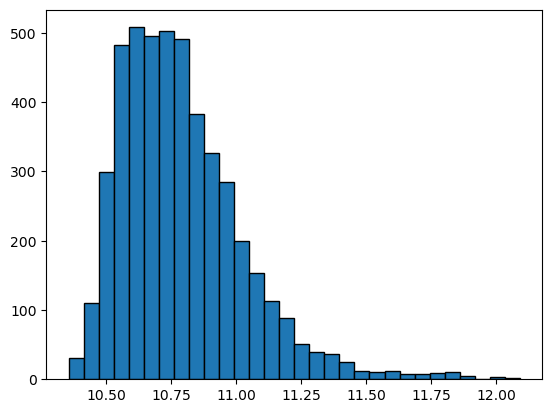

In [50]:
plt.hist(all_data[['lHHI_mean']], bins=30, edgecolor='black')

Text(0.5, 1.0, 'Ditribution of Average Income Dataset')

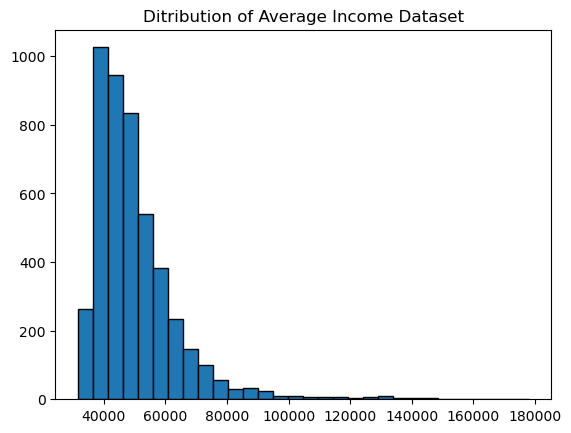

In [51]:
plt.hist(all_data[['HHI_mean']], bins=30, edgecolor='black')

plt.title('Ditribution of Average Income Dataset')

Text(0.5, 1.0, 'Ditribution of Population Density Dataset')

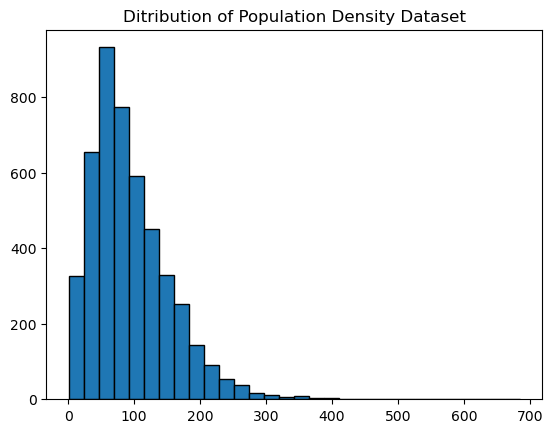

In [52]:
plt.hist(all_data[['POPDEN']], bins=30, edgecolor='black')
plt.title('Ditribution of Population Density Dataset')

(array([  2.,   4.,   5.,   1.,   3.,  11.,   8.,  15.,  15.,  13.,  43.,
         38.,  62.,  86., 124., 190., 249., 403., 541., 553., 592., 576.,
        462., 393., 189.,  80.,  26.,   8.,   3.,   1.]),
 array([0.18232156, 0.39387686, 0.60543217, 0.81698748, 1.02854279,
        1.2400981 , 1.4516534 , 1.66320871, 1.87476402, 2.08631933,
        2.29787463, 2.50942994, 2.72098525, 2.93254056, 3.14409586,
        3.35565117, 3.56720648, 3.77876179, 3.99031709, 4.2018724 ,
        4.41342771, 4.62498302, 4.83653832, 5.04809363, 5.25964894,
        5.47120425, 5.68275956, 5.89431486, 6.10587017, 6.31742548,
        6.52898079]),
 <BarContainer object of 30 artists>)

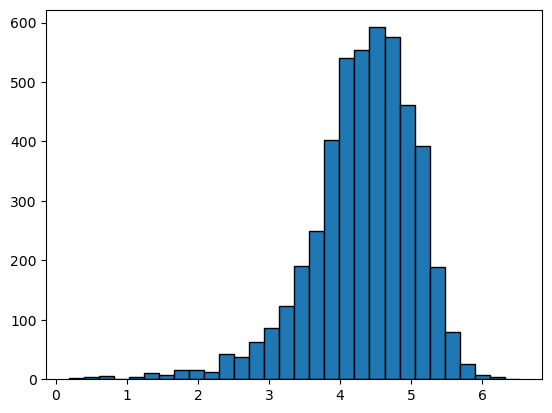

In [53]:
plt.hist(all_data[['lPOPDEN']], bins=30, edgecolor='black')

from scipy.stats import skew
data_skewness = skew(all_data[['hp2011_mean']])
all_data.dropna(inplace=True)
#print("Skewness:", data_skewness)

In [54]:
## normalize crime 

## all variables below have the units being percentage points 

all_data['crime_rate'] = all_data['all_crime']*100/all_data['USUALRES']
all_data['pcrime_rate'] = all_data['PropertyCrime']*100/all_data['USUALRES']
all_data['acrime_rate'] = all_data['antiCrime']*100/all_data['USUALRES']
all_data['vcrime_rate'] = all_data['ViolentCrime']*100/all_data['USUALRES']
all_data['restaurants_cafes_rate'] = all_data['restaurants_cafes']*100/all_data['USUALRES']
all_data['pubs_rate'] = all_data['pubs']*100/all_data['USUALRES']
all_data['clubs_rate'] = all_data['clubs']*100/all_data['USUALRES']


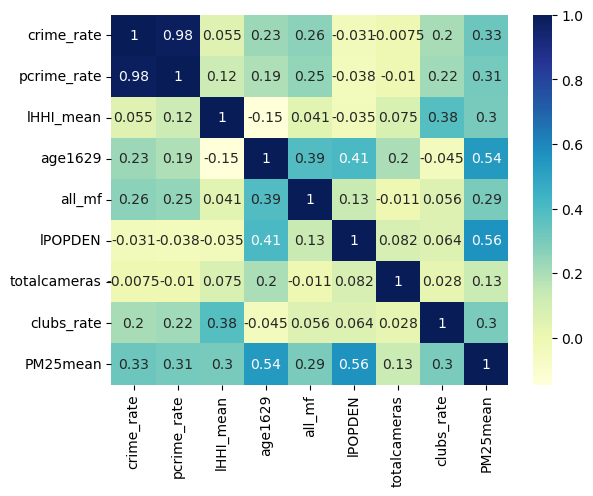

In [55]:
import seaborn as sb
  
#plotting correlation heatmap
dataplot = sb.heatmap(all_data[['crime_rate',
                                'pcrime_rate',
                             'lHHI_mean',
                             'age1629',
                              'all_mf',
                             'lPOPDEN',
                             'totalcameras',
                            'clubs_rate',
                            'PM25mean']].corr(), 
                      cmap="YlGnBu", 
                      annot=True)

In [56]:
## create some log variables 

all_data['lhp2011_mean'] = np.log(all_data['hp2011_mean'])

all_data['lHHI_mean'] = np.log(all_data['HHI_mean'])

all_data['lPOPDEN'] = np.log(all_data['POPDEN'])

In [57]:
variables = ['crime_rate',
             'pcrime_rate',
             'vcrime_rate',
             'lHHI_mean',
             'age1629',
             'all_mf',
             'lPOPDEN',
             'totalcameras',
            'clubs_rate'] ## you can add more variables if you like 

summary_table = all_data[variables].describe().T
summary_table

,count,mean,std,min,25%,50%,75%,max
crime_rate,4696.0,9.877267,14.924085,0.849673,5.398015,7.489423,10.450972,587.829787
pcrime_rate,4696.0,4.555774,10.693041,0.244798,1.958377,2.845387,4.374929,466.893617
vcrime_rate,4696.0,1.823400,1.872721,0.000000,0.887771,1.496920,2.247331,51.926978
lHHI_mean,4696.0,10.790952,0.238728,10.357425,10.614229,10.752890,10.914406,12.089707
age1629,4696.0,21.446473,6.243546,7.986577,17.323126,20.313954,24.238572,74.388889
all_mf,4696.0,97.941295,10.483127,62.600897,91.728949,96.544846,102.466396,244.703770
lPOPDEN,4696.0,4.321538,0.747928,0.182322,3.937691,4.409155,4.833102,6.528981
totalcameras,4287.0,242.773035,235.936107,58.000000,115.000000,169.000000,247.000000,1158.000000
clubs_rate,4696.0,1.247268,1.061944,0.207297,0.835596,1.040042,1.328904,11.616162


### regression analysis for all crime

In [58]:
all_data['crime_rate'].describe

<bound method NDFrame.describe of 0        6.400470
1       30.625449
2       11.593264
3       19.796954
4       42.323944
          ...    
4691    22.653722
4692     9.286413
4693     7.303371
4694    12.844037
4695     7.838983
Name: crime_rate, Length: 4696, dtype: float64>

In [59]:
## economic factors
#lm_1 = sm.OLS.from_formula('crime_rate ~ lHHI_mean + ue_rate', data= all_data).fit()
 
## economic factors 
lm_1 = sm.OLS.from_formula('crime_rate ~  lHHI_mean + ue_rate + C(Borough)', data= all_data).fit()

## economic factors + demographic factors 
lm_2 = sm.OLS.from_formula('crime_rate ~   lHHI_mean + ue_rate + age1629  + lPOPDEN+C(Borough)', data= all_data).fit()

lm_3 = sm.OLS.from_formula('crime_rate ~  lHHI_mean + ue_rate + age1629+ all_mf + lPOPDEN+C(Borough)', data= all_data).fit()

## economic factors + demographic factors + public security 
lm_4 = sm.OLS.from_formula('crime_rate ~  lHHI_mean + age1629 + lPOPDEN + totalcameras', data= all_data).fit()

## economic factors + demographic factors +  public security  + social contexts/environment 

lm_5 = sm.OLS.from_formula('crime_rate ~  lHHI_mean + age1629 + lPOPDEN + totalcameras + clubs_rate', data= all_data).fit()

## economic factors + demographic factors +  public security  + social contexts/environment + air polution 
#lm_5 = sm.OLS.from_formula('crime_rate ~  age1629 + lPOPDEN +PM25mean+C(Borough)', data= all_data).fit()

regression_table = Stargazer((lm_1,
                    lm_2,
                   lm_3,
                    lm_4,
                    lm_5))


regression_table.add_line('Borough Fixed Effect',
                        ['Yes',
                        'Yes',
                        'Yes',
                        'No',
                        'No'])

regression_table.show_f_statistic=False
from IPython.core.display import HTML
HTML(regression_table.render_html())

In [60]:
## take log on variables is to make the coefficients insensitive to the units of measure/ normalize the change retative to its value
## /descale it 


## each percent increase in HHI_mean (1% increase): 2 percentage points decrease in crime rate, e.g. 4% -> 2%
## each percentage point increase in UE_rate  (3% -> 4%): 1.4 percentage points increase in crime rate, e.g. 3% ->4%.
### each 1% increase in population density: 4.9 percentage points decrease in crime rate, e.g. 5.9% -> 1%


In [61]:
#1. interaction effect/neighbourhood effect/endogeneous effect/peer effect: Y1 and Y2 and Yn have effects on each other
#2. common factor/ common driver:  X1 and X2 are similar to each other and X affects Y. hence Y1 and Y2 are correlated. 

### regression analysis for property crime

In [62]:
all_data['pcrime_rate'].describe

<bound method NDFrame.describe of 0        2.524956
1        9.705248
2        3.950777
3        6.147772
4       23.028169
          ...    
4691     9.142395
4692     3.128055
4693     3.558052
4694     7.506255
4695     3.460452
Name: pcrime_rate, Length: 4696, dtype: float64>

In [63]:
## economic factors
#lm_1 = sm.OLS.from_formula('crime_rate ~ lHHI_mean + ue_rate', data= all_data).fit()
 
## economic factors 
lm_1 = sm.OLS.from_formula('pcrime_rate ~  lHHI_mean + ue_rate + C(Borough)', data= all_data).fit()

## economic factors + demographic factors 
#lm_2 = sm.OLS.from_formula('pcrime_rate ~  lHHI_mean + ue_rate + age1629  + lPOPDEN+C(Borough)', data= all_data).fit()

lm_2 = sm.OLS.from_formula('pcrime_rate ~  lHHI_mean + ue_rate + age1629+ all_mf + lPOPDEN+C(Borough)', data= all_data).fit()

## economic factors + demographic factors + public security 
lm_3 = sm.OLS.from_formula('pcrime_rate ~  lHHI_mean + ue_rate + age1629 + all_mf + lPOPDEN + totalcameras', data= all_data).fit()

## economic factors + demographic factors +  public security  + social contexts/environment 

lm_4 = sm.OLS.from_formula('pcrime_rate ~ lHHI_mean + ue_rate + age1629 + all_mf + lPOPDEN + totalcameras + clubs_rate', data= all_data).fit()

## economic factors + demographic factors +  public security  + social contexts/environment + air polution 
#lm_5 = sm.OLS.from_formula('crime_rate ~  age1629 + lPOPDEN +PM25mean+C(Borough)', data= all_data).fit()

regression_table = Stargazer((lm_1,
                    lm_2,
                   lm_3,
                    lm_4
                    #lm_5
                             ))


regression_table.add_line('Borough Fixed Effect',
                        ['Yes',
                        'Yes',
                        'No',
                        'No'])

regression_table.show_f_statistic=False
from IPython.core.display import HTML
HTML(regression_table.render_html())

### regression analysis for antisocial behaviour crime

In [64]:
all_data['acrime_rate'].describe

<bound method NDFrame.describe of 0       0.822079
1       6.398275
2       1.943005
3       4.342922
4       6.549296
          ...   
4691    4.854369
4692    2.101662
4693    0.749064
4694    1.501251
4695    0.706215
Name: acrime_rate, Length: 4696, dtype: float64>

In [65]:
## economic factors
#lm_1 = sm.OLS.from_formula('crime_rate ~ lHHI_mean + ue_rate', data= all_data).fit()
 
## economic factors 
lm_1 = sm.OLS.from_formula('acrime_rate ~  lHHI_mean + ue_rate + C(Borough)', data= all_data).fit()

## economic factors + demographic factors 
lm_2 = sm.OLS.from_formula('acrime_rate ~   lHHI_mean + ue_rate + age1629  + lPOPDEN+C(Borough)', data= all_data).fit()

lm_3 = sm.OLS.from_formula('acrime_rate ~  lHHI_mean + ue_rate + age1629+all_mf + lPOPDEN+C(Borough)', data= all_data).fit()

## economic factors + demographic factors + public security 
lm_4 = sm.OLS.from_formula('acrime_rate ~  lHHI_mean + age1629 + lPOPDEN + totalcameras', data= all_data).fit()

## economic factors + demographic factors +  public security  + social contexts/environment 

lm_5 = sm.OLS.from_formula('acrime_rate ~  lHHI_mean + age1629 + lPOPDEN + totalcameras + clubs_rate', data= all_data).fit()

## economic factors + demographic factors +  public security  + social contexts/environment + air polution 
#lm_5 = sm.OLS.from_formula('crime_rate ~  age1629 + lPOPDEN +PM25mean+C(Borough)', data= all_data).fit()

regression_table = Stargazer((lm_1,
                    lm_2,
                   lm_3,
                    lm_4,
                    lm_5))


regression_table.add_line('Borough Fixed Effect',
                        ['Yes',
                        'Yes',
                        'Yes',
                        'No',
                        'No'])

regression_table.show_f_statistic=False
from IPython.core.display import HTML
HTML(regression_table.render_html())

### regression analysis for violent crime

In [66]:
all_data['vcrime_rate'].describe

<bound method NDFrame.describe of 0       0.998238
1       8.986341
2       2.137306
3       4.963339
4       8.098592
          ...   
4691    5.420712
4692    2.199413
4693    1.779026
4694    1.751460
4695    1.624294
Name: vcrime_rate, Length: 4696, dtype: float64>

In [67]:
## economic factors
#lm_1 = sm.OLS.from_formula('crime_rate ~ lHHI_mean + ue_rate', data= all_data).fit()
 
## economic factors 
lm_1 = sm.OLS.from_formula('vcrime_rate ~  lHHI_mean + ue_rate + C(Borough)', data= all_data).fit()

## economic factors + demographic factors 
lm_2 = sm.OLS.from_formula('vcrime_rate ~   lHHI_mean + ue_rate + age1629  + lPOPDEN+C(Borough)', data= all_data).fit()

lm_3 = sm.OLS.from_formula('vcrime_rate ~  lHHI_mean + ue_rate + age1629+all_mf + lPOPDEN+C(Borough)', data= all_data).fit()

## economic factors + demographic factors + public security 
lm_4 = sm.OLS.from_formula('vcrime_rate ~  lHHI_mean + age1629 + lPOPDEN + totalcameras', data= all_data).fit()

## economic factors + demographic factors +  public security  + social contexts/environment 

lm_5 = sm.OLS.from_formula('vcrime_rate ~  lHHI_mean + age1629 + lPOPDEN + totalcameras + clubs_rate', data= all_data).fit()

## economic factors + demographic factors +  public security  + social contexts/environment + air polution 
#lm_5 = sm.OLS.from_formula('crime_rate ~  age1629 + lPOPDEN +PM25mean+C(Borough)', data= all_data).fit()

regression_table = Stargazer((lm_1,
                    lm_2,
                   lm_3,
                    lm_4,
                    lm_5))


regression_table.add_line('Borough Fixed Effect',
                        ['Yes',
                        'Yes',
                        'Yes',
                        'No',
                        'No'])

regression_table.show_f_statistic=False
from IPython.core.display import HTML
HTML(regression_table.render_html())

In [68]:
## violent crime rate
## economic factors 
lm_1 = sm.OLS.from_formula('vcrime_rate ~  lHHI_mean + ue_rate + C(Borough)', data= all_data).fit()

## economic factors + demographic factors 

lm_2 = sm.OLS.from_formula('vcrime_rate ~  lHHI_mean + ue_rate + age1629+ all_mf + lPOPDEN+C(Borough)', data= all_data).fit()

## economic factors + demographic factors +  public security  + social contexts/environment 

lm_3 = sm.OLS.from_formula('vcrime_rate ~ lHHI_mean + ue_rate + age1629 + all_mf + lPOPDEN + totalcameras + clubs_rate', data= all_data).fit()

## antisocial behaviour crime rate
## economic factors 
lm_4 = sm.OLS.from_formula('acrime_rate ~  lHHI_mean + ue_rate + C(Borough)', data= all_data).fit()

## economic factors + demographic factors 

lm_5 = sm.OLS.from_formula('acrime_rate ~  lHHI_mean + ue_rate + age1629+ all_mf + lPOPDEN+C(Borough)', data= all_data).fit()

## economic factors + demographic factors +  public security  + social contexts/environment 

lm_6 = sm.OLS.from_formula('acrime_rate ~ lHHI_mean + ue_rate + age1629 + all_mf + lPOPDEN + totalcameras + clubs_rate', data= all_data).fit()


regression_table = Stargazer((lm_1,
                    lm_2,
                   lm_3,
                    lm_4,
                    lm_5,
                    lm_6))


regression_table.add_line('Borough Fixed Effect',
                        ['Yes',
                        'Yes',
                        'No',
                        'Yes',
                        'Yes',
                        'No'])

regression_table.show_f_statistic=False
from IPython.core.display import HTML
HTML(regression_table.render_html())

### Spatial Weight

In [69]:
import sys
import os
import urllib
import zipfile
import geopandas as gpd
import seaborn as sns
import shapely.geometry
from shapely.geometry import Point, Polygon
import libpysal as lps
from libpysal.weights import Queen, Rook, KNN
import pysal as ps
import numpy as np
import pandas as pd
import spreg
import mgwr
import mapclassify
import matplotlib.pyplot as plt
import pysal.viz as viz
%matplotlib inline
import warnings
warnings.simplefilter('ignore')
from shapely.wkt import loads 
from shapely import wkt
from libpysal import weights

In [70]:
df = pd.read_csv('merge_crime and lsoa data.csv')

In [71]:
df['crime_rate'] = df['all_crime']*100/all_data['USUALRES']
df['pcrime_rate'] = df['PropertyCrime']*100/all_data['USUALRES']
df['acrime_rate'] = df['antiCrime']*100/all_data['USUALRES']
df['vcrime_rate'] = df['ViolentCrime']*100/all_data['USUALRES']

In [72]:
df = df[['LSOA Code','LSOA Name','Borough','HHI_mean','crime_rate','pcrime_rate','acrime_rate','vcrime_rate','age1629','hp2011_mean','totalcameras','PM25mean','POPDEN','restaurants_cafes','pubs','clubs','geometry']]
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4696 entries, 0 to 4695
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   LSOA Code          4696 non-null   object 
 1   LSOA Name          4696 non-null   object 
 2   Borough            4696 non-null   object 
 3   HHI_mean           4696 non-null   int64  
 4   crime_rate         4696 non-null   float64
 5   pcrime_rate        4696 non-null   float64
 6   acrime_rate        4696 non-null   float64
 7   vcrime_rate        4696 non-null   float64
 8   age1629            4696 non-null   float64
 9   hp2011_mean        4574 non-null   float64
 10  totalcameras       4287 non-null   float64
 11  PM25mean           4696 non-null   float64
 12  POPDEN             4696 non-null   float64
 13  restaurants_cafes  4696 non-null   int64  
 14  pubs               4696 non-null   int64  
 15  clubs              4696 non-null   int64  
 16  geometry           4696 

In [73]:
df = df.dropna()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4179 entries, 0 to 4695
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   LSOA Code          4179 non-null   object 
 1   LSOA Name          4179 non-null   object 
 2   Borough            4179 non-null   object 
 3   HHI_mean           4179 non-null   int64  
 4   crime_rate         4179 non-null   float64
 5   pcrime_rate        4179 non-null   float64
 6   acrime_rate        4179 non-null   float64
 7   vcrime_rate        4179 non-null   float64
 8   age1629            4179 non-null   float64
 9   hp2011_mean        4179 non-null   float64
 10  totalcameras       4179 non-null   float64
 11  PM25mean           4179 non-null   float64
 12  POPDEN             4179 non-null   float64
 13  restaurants_cafes  4179 non-null   int64  
 14  pubs               4179 non-null   int64  
 15  clubs              4179 non-null   int64  
 16  geometry           4179 

In [74]:
df['geometry'] = df['geometry'].apply(wkt.loads)

In [75]:
crs = {'init': 'epsg:27700'}
gdf = gpd.GeoDataFrame(df, crs=crs, geometry='geometry')

In [76]:
gdf.to_file('your_shapefile.shp', driver='ESRI Shapefile')

In [77]:
gdf=gpd.read_file('your_shapefile.shp')
gdf

,LSOA Code,LSOA Name,Borough,HHI_mean,crime_rate,pcrime_rat,acrime_rat,vcrime_rat,age1629,hp2011_mea,totalcamer,PM25mean,POPDEN,restaurant,pubs,clubs,geometry
0,E01000006,Barking and Dagenham 016A,Barking and Dagenham,43610,6.400470,2.524956,0.822079,0.998238,22.782705,2.244115e+05,115.0,15.7733,116.2,30,25,10,"POLYGON ((545122.084 184321.013, 545271.951 18..."
1,E01000008,Barking and Dagenham 015B,Barking and Dagenham,36020,11.593264,3.950777,1.943005,2.137306,24.876543,1.538976e+05,115.0,16.1865,79.1,30,25,10,"MULTIPOLYGON (((543565.881 183957.978, 543527...."
2,E01000009,Barking and Dagenham 016B,Barking and Dagenham,40190,19.796954,6.147772,4.342922,4.963339,28.376162,2.290392e+05,115.0,16.1256,138.6,30,25,10,"POLYGON ((544499.878 184710.438, 544630.332 18..."
3,E01000010,Barking and Dagenham 015C,Barking and Dagenham,40150,42.323944,23.028169,6.549296,8.098592,31.955128,1.582382e+05,115.0,16.0996,80.7,30,25,10,"POLYGON ((544174.051 184367.074, 544211.051 18..."
4,E01000011,Barking and Dagenham 016C,Barking and Dagenham,39740,7.282742,2.264382,1.162791,1.713586,30.924171,2.154774e+05,115.0,15.9539,178.2,30,25,10,"POLYGON ((544523.441 184795.110, 544667.093 18..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4174,E01033603,Westminster 009I,Westminster,55130,10.952738,4.426107,2.025506,2.475619,26.561324,5.137775e+05,153.0,18.3187,267.7,1130,450,115,"POLYGON ((527390.543 181981.311, 527455.328 18..."
4175,E01033605,Westminster 009K,Westminster,44660,9.286413,3.128055,2.101662,2.199413,19.004739,3.315291e+05,153.0,16.9981,277.6,1130,450,115,"POLYGON ((526888.654 182297.746, 526866.536 18..."
4176,E01033606,Westminster 014F,Westminster,80250,7.303371,3.558052,0.749064,1.779026,24.056604,8.844827e+05,153.0,17.1574,394.1,1130,450,115,"POLYGON ((525237.615 181564.542, 525258.050 18..."
4177,E01033607,Westminster 014G,Westminster,79550,12.844037,7.506255,1.501251,1.751460,21.505376,1.111940e+06,153.0,17.7406,143.9,1130,450,115,"POLYGON ((525582.456 181644.663, 525565.462 18..."


In [78]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4179 entries, 0 to 4178
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   LSOA Code   4179 non-null   object  
 1   LSOA Name   4179 non-null   object  
 2   Borough     4179 non-null   object  
 3   HHI_mean    4179 non-null   int64   
 4   crime_rate  4179 non-null   float64 
 5   pcrime_rat  4179 non-null   float64 
 6   acrime_rat  4179 non-null   float64 
 7   vcrime_rat  4179 non-null   float64 
 8   age1629     4179 non-null   float64 
 9   hp2011_mea  4179 non-null   float64 
 10  totalcamer  4179 non-null   float64 
 11  PM25mean    4179 non-null   float64 
 12  POPDEN      4179 non-null   float64 
 13  restaurant  4179 non-null   int64   
 14  pubs        4179 non-null   int64   
 15  clubs       4179 non-null   int64   
 16  geometry    4179 non-null   geometry
dtypes: float64(9), geometry(1), int64(4), object(3)
memory usage: 555.1+ KB


In [79]:
if gdf.crs is not None:
    print('CRS information is present.')
else:
    print('CRS information is not present.')

CRS information is present.


In [80]:
gdf.crs

<Derived Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [81]:
print(gdf.columns.tolist())

['LSOA Code', 'LSOA Name', 'Borough', 'HHI_mean', 'crime_rate', 'pcrime_rat', 'acrime_rat', 'vcrime_rat', 'age1629', 'hp2011_mea', 'totalcamer', 'PM25mean', 'POPDEN', 'restaurant', 'pubs', 'clubs', 'geometry']


In [82]:
w_queen = Queen.from_dataframe(gdf)
w_queen.n

4179

In [83]:
print ('%.4f'%w_queen.pct_nonzero)

0.1379


In [84]:
w_queen.histogram

[(1, 3),
 (2, 39),
 (3, 198),
 (4, 632),
 (5, 1040),
 (6, 1084),
 (7, 637),
 (8, 334),
 (9, 133),
 (10, 49),
 (11, 16),
 (12, 10),
 (13, 2),
 (14, 1),
 (15, 1)]

In [85]:
#w_queen = weights.contiguity.Queen.from_dataframe(gdf, ids=gdf['LSOA Name'].tolist())

In [86]:
w_queen.neighbors

{0: [56, 2, 59, 36],
 1: [3026, 3, 3141, 5, 104, 2989, 3023],
 2: [0, 3, 36, 4, 56],
 3: [1, 2, 36, 104, 105, 40],
 4: [56, 2, 3144, 5],
 5: [1, 4, 3141, 3143, 3144, 3145],
 6: [7, 8, 11, 72, 93],
 7: [67, 6, 72, 9, 10, 11, 47, 63],
 8: [96, 6, 9, 11, 28, 93, 94],
 9: [7, 8, 10, 11, 50, 52, 53, 27, 28],
 10: [50, 67, 69, 53, 7, 9],
 11: [8, 9, 6, 7],
 12: [86, 103, 3128, 13, 14, 15],
 13: [17, 103, 86, 71, 90, 12, 15],
 14: [16, 17, 18, 3126, 3128, 12, 15],
 15: [17, 12, 13, 14],
 16: [18, 3126, 54, 3147, 61, 14],
 17: [65, 18, 71, 13, 14, 15],
 18: [16, 65, 17, 62, 61, 14],
 19: [20, 2021, 22, 23, 2027, 3053, 3135],
 20: [3053, 19, 21, 22],
 21: [3076, 3077, 20, 22, 23, 24, 3053],
 22: [19, 20, 21, 23],
 23: [98, 100, 2021, 2026, 19, 21, 22, 24, 1946],
 24: [3074, 3075, 100, 3077, 101, 3078, 21, 23],
 25: [49, 26, 27, 52],
 26: [49, 25, 27, 29, 30, 31],
 27: [52, 9, 26, 28, 25, 31],
 28: [96, 8, 9, 27, 31, 95],
 29: [2019, 1945, 26, 30, 31],
 30: [1944, 1945, 26, 1947, 29],
 31: [2018

<AxesSubplot: >

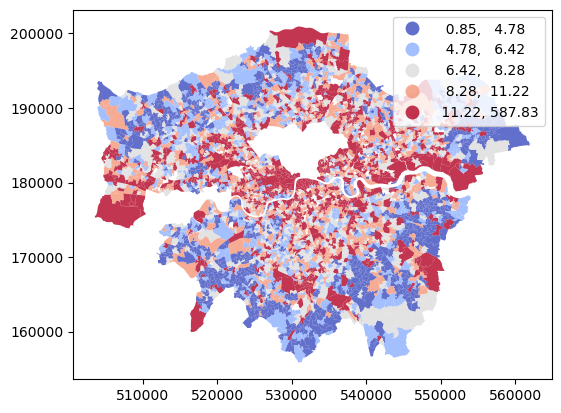

In [87]:
gdf.plot(column='crime_rate', 
         alpha=0.8, 
         cmap='coolwarm', 
         scheme='quantiles',
        legend = True)

ax = gdf.plot(edgecolor='grey', facecolor='w', figsize=(20, 12))
f,ax = w_queen.plot(gdf, ax=ax, 
                   edge_kws=dict(color='r', linestyle=':', linewidth=1),
                   node_kws=dict(marker=''))

### Spatial Autocorrelation: Moran's I

In [88]:
# Graphics
import matplotlib.pyplot as plt
from matplotlib import colors
# Analysis
import geopandas as gpd
import pandas as pd
from libpysal import weights
from pysal.explore import esda
import numpy as np

In [89]:
gdf.head()

,LSOA Code,LSOA Name,Borough,HHI_mean,crime_rate,pcrime_rat,acrime_rat,vcrime_rat,age1629,hp2011_mea,totalcamer,PM25mean,POPDEN,restaurant,pubs,clubs,geometry
0,E01000006,Barking and Dagenham 016A,Barking and Dagenham,43610,6.400470,2.524956,0.822079,0.998238,22.782705,224411.514503,115.0,15.7733,116.2,30,25,10,"POLYGON ((545122.084 184321.013, 545271.951 18..."
1,E01000008,Barking and Dagenham 015B,Barking and Dagenham,36020,11.593264,3.950777,1.943005,2.137306,24.876543,153897.619047,115.0,16.1865,79.1,30,25,10,"MULTIPOLYGON (((543565.881 183957.978, 543527...."
2,E01000009,Barking and Dagenham 016B,Barking and Dagenham,40190,19.796954,6.147772,4.342922,4.963339,28.376162,229039.186508,115.0,16.1256,138.6,30,25,10,"POLYGON ((544499.878 184710.438, 544630.332 18..."
3,E01000010,Barking and Dagenham 015C,Barking and Dagenham,40150,42.323944,23.028169,6.549296,8.098592,31.955128,158238.177190,115.0,16.0996,80.7,30,25,10,"POLYGON ((544174.051 184367.074, 544211.051 18..."
4,E01000011,Barking and Dagenham 016C,Barking and Dagenham,39740,7.282742,2.264382,1.162791,1.713586,30.924171,215477.430555,115.0,15.9539,178.2,30,25,10,"POLYGON ((544523.441 184795.110, 544667.093 18..."


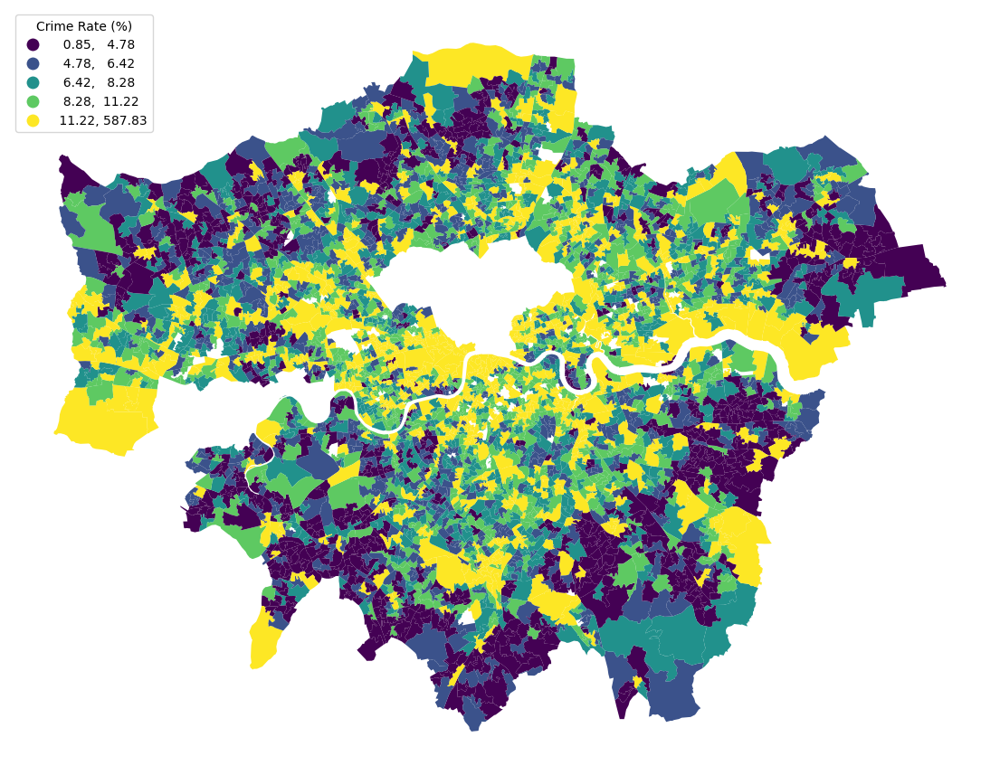

In [90]:
#all crime
fig, ax = plt.subplots(1, figsize=(14, 14))
gdf.plot(column='crime_rate', cmap='viridis',
scheme='quantiles', k=5,
linewidth=0.,
legend=True, legend_kwds={"title":"Crime Rate (%)","loc": 2},
ax=ax)
ax.set_axis_off()

In [91]:
w = weights.KNN.from_dataframe(gdf, k=8)
w.transform = 'R'
moran = esda.moran.Moran(gdf['crime_rate'], w)
round(moran.I,3)

0.42

In [92]:
moran.p_sim

0.001

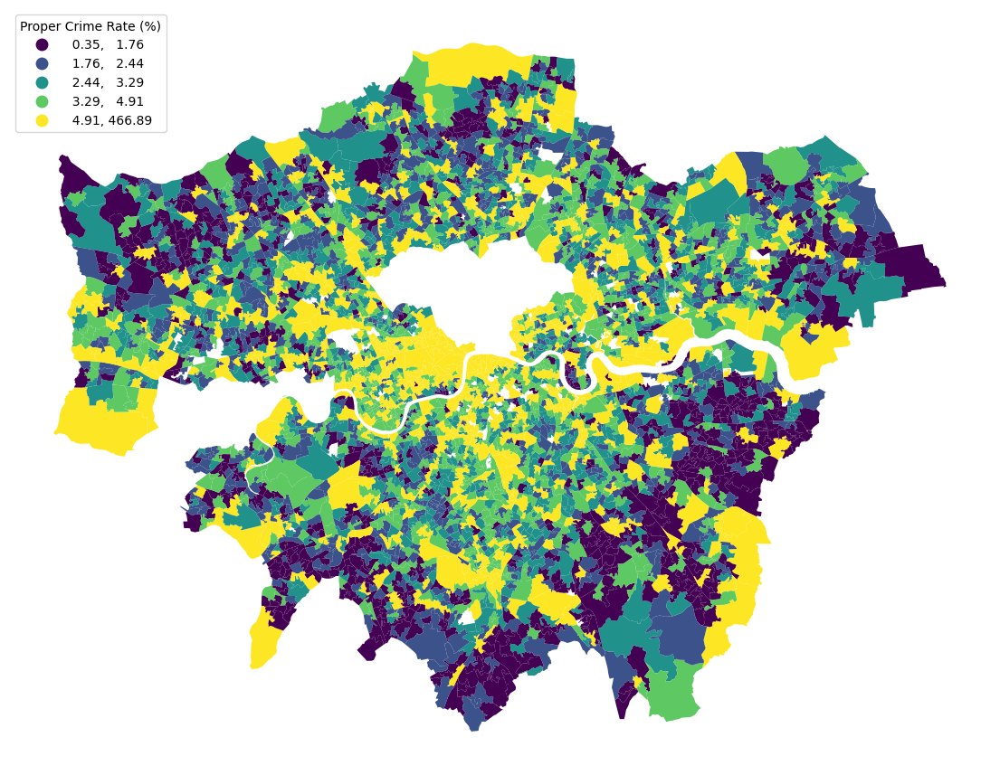

In [93]:
#property crime
fig, ax = plt.subplots(1, figsize=(14, 14))
gdf.plot(column='pcrime_rat', cmap='viridis',
scheme='quantiles', k=5,
linewidth=0.,
legend=True, legend_kwds={"title":"Proper Crime Rate (%)","loc": 2},
ax=ax)
ax.set_axis_off()

In [94]:
w = weights.KNN.from_dataframe(gdf, k=8)
w.transform = 'R'
moran = esda.moran.Moran(gdf['pcrime_rat'], w)
round(moran.I,3)

0.424

In [95]:
moran.p_sim

0.001

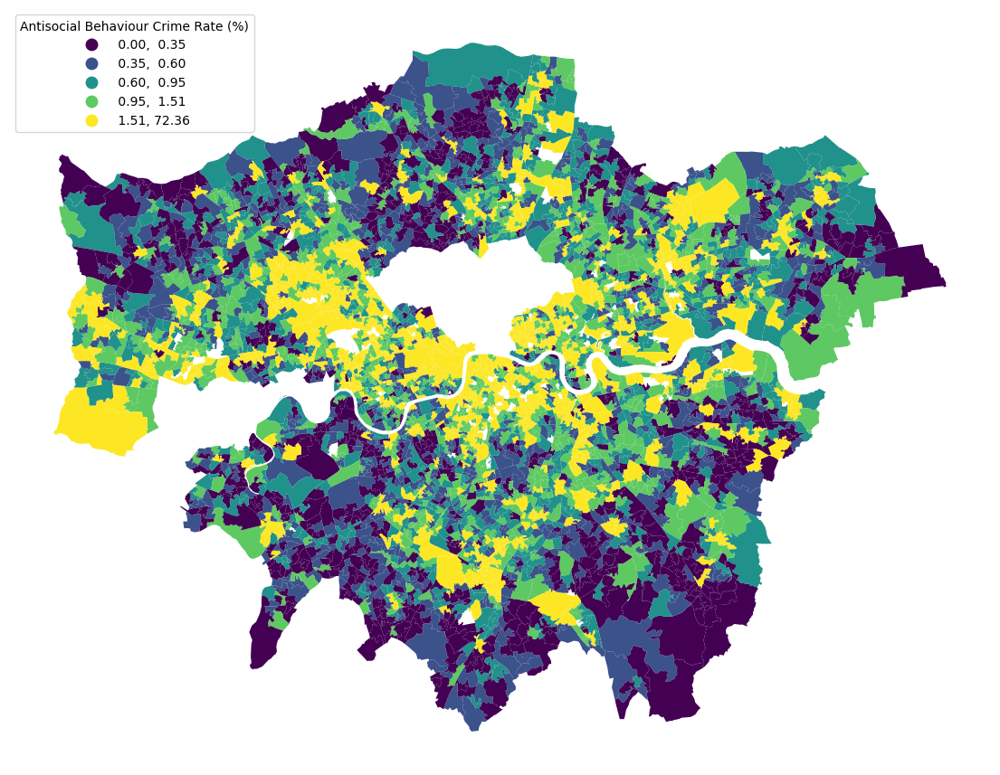

In [96]:
#antisocial behaviour crime
fig, ax = plt.subplots(1, figsize=(14, 14))
gdf.plot(column='acrime_rat', cmap='viridis',
scheme='quantiles', k=5,
linewidth=0.,
legend=True, legend_kwds={"title":"Antisocial Behaviour Crime Rate (%)","loc": 2},
ax=ax)
ax.set_axis_off()

In [97]:
w = weights.KNN.from_dataframe(gdf, k=8)
w.transform = 'R'
moran = esda.moran.Moran(gdf['acrime_rat'], w)
round(moran.I,3)

0.376

In [98]:
moran.p_sim

0.001

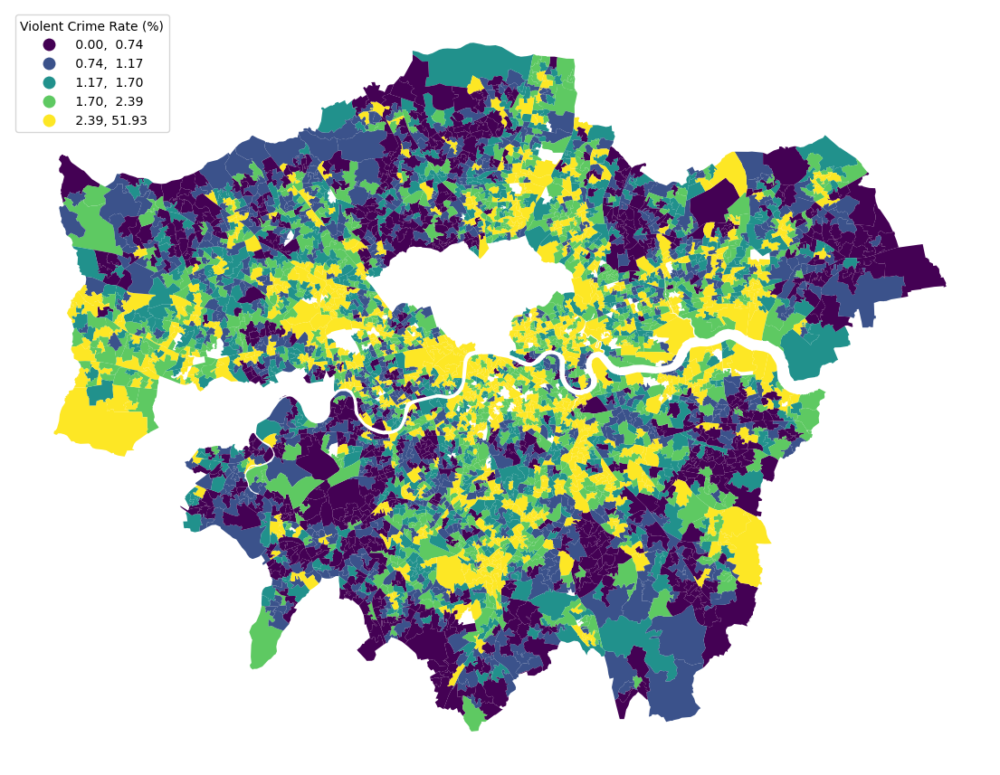

In [99]:
#violent crime
fig, ax = plt.subplots(1, figsize=(14, 14))
gdf.plot(column='vcrime_rat', cmap='viridis',
scheme='quantiles', k=5,
linewidth=0.,
legend=True, legend_kwds={"title":"Violent Crime Rate (%)","loc": 2},
ax=ax)
ax.set_axis_off()

In [100]:
w = weights.KNN.from_dataframe(gdf, k=8)
w.transform = 'R'
moran = esda.moran.Moran(gdf['vcrime_rat'], w)
round(moran.I,3)

0.32

In [101]:
moran.p_sim

0.001

### Moran Plot for crime rate

In [102]:
gdf['crime_rate_lag'] = weights.spatial_lag.lag_spatial(w, gdf['crime_rate'])

In [103]:
def standardize(df, var):
    name = var + '_z'
    df[name] = (df[var] - df[var].mean()) / df[var].std()

standardize(gdf,'crime_rate')
standardize(gdf,'crime_rate_lag')

In [104]:
gdf.tail()

,LSOA Code,LSOA Name,Borough,HHI_mean,crime_rate,pcrime_rat,acrime_rat,vcrime_rat,age1629,hp2011_mea,totalcamer,PM25mean,POPDEN,restaurant,pubs,clubs,geometry,crime_rate_lag,crime_rate_z,crime_rate_lag_z
4174,E01033603,Westminster 009I,Westminster,55130,10.952738,4.426107,2.025506,2.475619,26.561324,5.137775e+05,153.0,18.3187,267.7,1130,450,115,"POLYGON ((527390.543 181981.311, 527455.328 18...",12.519413,0.083739,0.337705
4175,E01033605,Westminster 009K,Westminster,44660,9.286413,3.128055,2.101662,2.199413,19.004739,3.315291e+05,153.0,16.9981,277.6,1130,450,115,"POLYGON ((526888.654 182297.746, 526866.536 18...",9.761912,-0.025144,0.035109
4176,E01033606,Westminster 014F,Westminster,80250,7.303371,3.558052,0.749064,1.779026,24.056604,8.844827e+05,153.0,17.1574,394.1,1130,450,115,"POLYGON ((525237.615 181564.542, 525258.050 18...",11.388450,-0.154723,0.213599
4177,E01033607,Westminster 014G,Westminster,79550,12.844037,7.506255,1.501251,1.751460,21.505376,1.111940e+06,153.0,17.7406,143.9,1130,450,115,"POLYGON ((525582.456 181644.663, 525565.462 18...",9.944625,0.207323,0.055160
4178,E01033608,Westminster 007G,Westminster,80140,7.838983,3.460452,0.706215,1.624294,19.145803,5.671237e+05,153.0,16.9494,269.7,1130,450,115,"POLYGON ((525895.778 182291.431, 525835.542 18...",6.891216,-0.119725,-0.279908


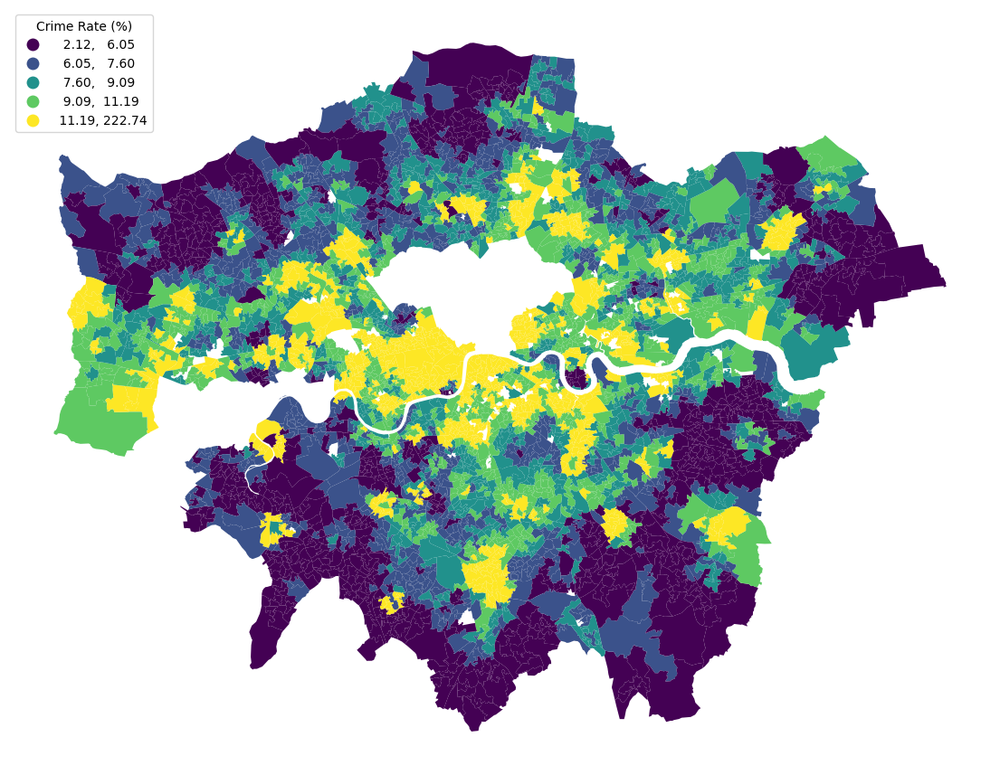

In [105]:
fig, ax = plt.subplots(1, figsize=(14, 14))
gdf.plot(column='crime_rate_lag', cmap='viridis',
scheme='quantiles', k=5,
linewidth=0.,
legend=True, legend_kwds={"title":"Crime Rate (%)","loc": 2},
ax=ax)
ax.set_axis_off()

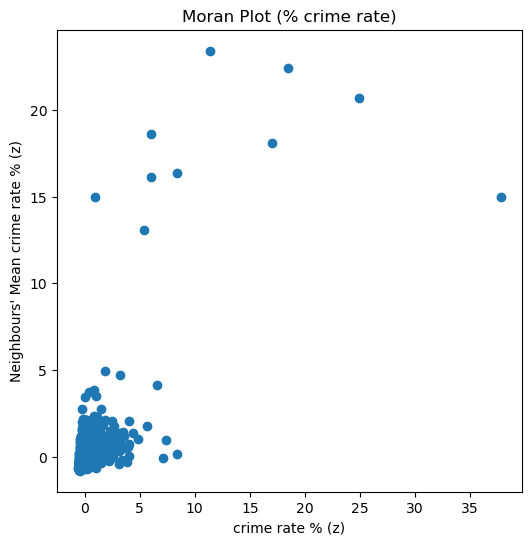

In [106]:
# Setup the figure and axis
fig, ax = plt.subplots(1, figsize=(6, 6))
# Plot values
plt.scatter(gdf['crime_rate_z'], gdf['crime_rate_lag_z'])
# Display
ax.set_title('Moran Plot (% crime rate)')
ax.set_xlabel("crime rate % (z)")
ax.set_ylabel("Neighbours' Mean crime rate % (z)")
plt.show()

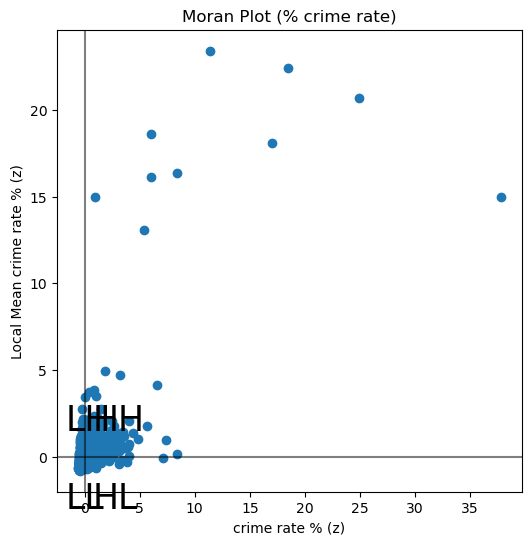

In [107]:
# Setup the figure and axis
fig, ax = plt.subplots(1, figsize=(6, 6))
# Plot values
plt.scatter(gdf['crime_rate_z'], gdf['crime_rate_lag_z'])
# Add vertical and horizontal lines through zero
ax.axvline(0, c='k', alpha=0.5)
ax.axhline(0, c='k', alpha=0.5)
# Add text labels for each quadrant
plt.text(0.75, 1.5, "HH", fontsize=25)
plt.text(0.75, -3, "HL", fontsize=25)
plt.text(-1.75, 1.5, "LH", fontsize=25)
plt.text(-1.75, -3, "LL", fontsize=25)
# Display
ax.set_title('Moran Plot (% crime rate)')
ax.set_xlabel("crime rate % (z)")
ax.set_ylabel("Local Mean crime rate % (z)")
plt.show()

In [108]:
def rules(row):
    if row['crime_rate_z'] > 0:
        if row['crime_rate_lag_z'] > 0:
            return 'HH'
        else:
            return 'HL'
    else:
        if row['crime_rate_lag_z'] > 0:
            return 'LH'
        else:
            return 'LL'

gdf['quadrant'] = gdf.apply(rules, 1)

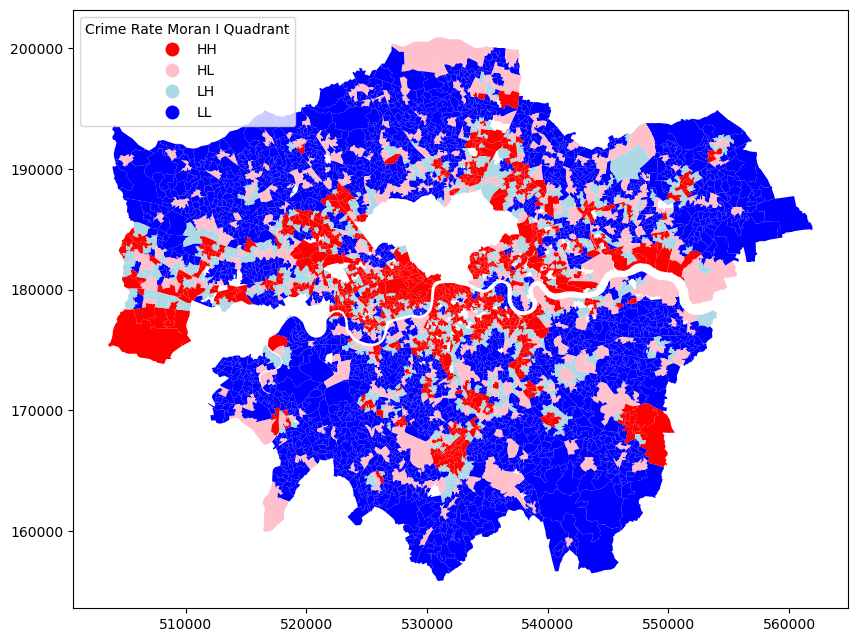

In [109]:
fig, ax = plt.subplots(1, figsize=(10,8))

qcolors = {'HH':'red', 'HL':'pink', 'LH':'lightblue', 'LL':'blue'}

#map
gdf.plot(column='quadrant', categorical=True, cmap=colors.ListedColormap(qcolors.values()),
         k=2, edgecolor='white', linewidth=0.0,
         legend=True, legend_kwds={"title":'Crime Rate Moran I Quadrant',"loc": 2},
         ax=ax)

#scatter plot
#ax[1].scatter(gdf['crime_rate_z'], gdf['crime_rate_lag_z'], c=gdf['quadrant'].map(qcolors))
#ax[1].axvline(0, c='k', alpha=0.5)
#ax[1].axhline(0, c='k', alpha=0.5)
#ax[1].set_xlabel("crime rate % (z)")
#ax[1].set_ylabel("Local Mean crime rate % (z)")

plt.show()

### Moran I for Property Crime

In [110]:
gdf['pcrime_rat_lag'] = weights.spatial_lag.lag_spatial(w, gdf['pcrime_rat'])

In [111]:
def standardize(df, var):
    name = var + '_z'
    df[name] = (df[var] - df[var].mean()) / df[var].std()

standardize(gdf,'pcrime_rat')
standardize(gdf,'pcrime_rat_lag')

In [112]:
def rules(row):
    if row['pcrime_rat_z'] > 0:
        if row['pcrime_rat_lag_z'] > 0:
            return 'HH'
        else:
            return 'HL'
    else:
        if row['pcrime_rat_lag_z'] > 0:
            return 'LH'
        else:
            return 'LL'

gdf['quadrant'] = gdf.apply(rules, 1)

<AxesSubplot: >

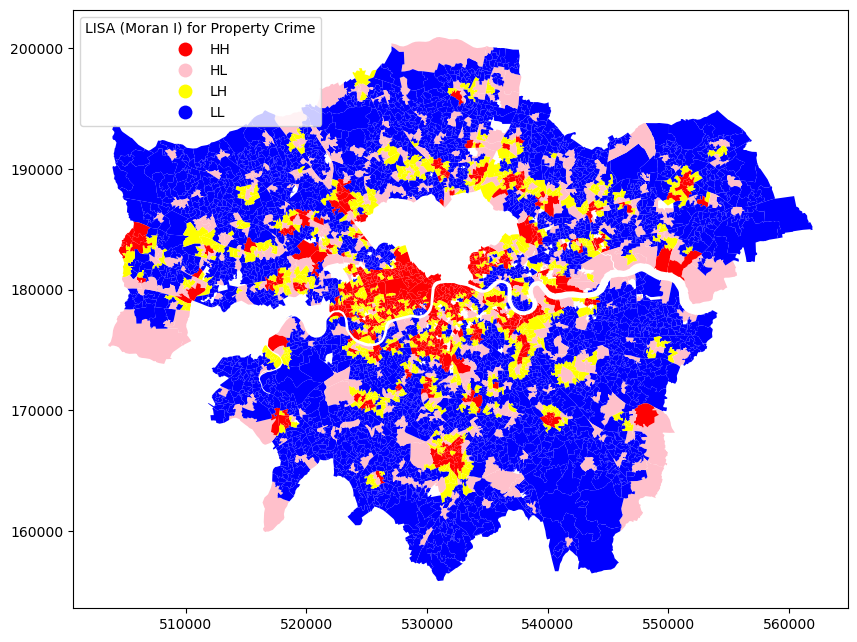

In [113]:
fig, ax = plt.subplots(1, figsize=(10,8))

qcolors = {'HH':'red', 'HL':'pink', 'LH':'yellow', 'LL':'blue'}

#map
gdf.plot(column='quadrant', categorical=True, cmap=colors.ListedColormap(qcolors.values()),
         k=2, edgecolor='white', linewidth=0.0,
         legend=True, legend_kwds={"title":'LISA (Moran I) for Property Crime',"loc": 2},
         ax=ax)


### Moran I for antisocial behaviour crime

In [114]:
gdf['acrime_rat_lag'] = weights.spatial_lag.lag_spatial(w, gdf['acrime_rat'])

In [115]:
def standardize(df, var):
    name = var + '_z'
    df[name] = (df[var] - df[var].mean()) / df[var].std()

standardize(gdf,'acrime_rat')
standardize(gdf,'acrime_rat_lag')

In [116]:
def rules(row):
    if row['acrime_rat_z'] > 0:
        if row['acrime_rat_lag_z'] > 0:
            return 'HH'
        else:
            return 'HL'
    else:
        if row['acrime_rat_lag_z'] > 0:
            return 'LH'
        else:
            return 'LL'

gdf['quadrant'] = gdf.apply(rules, 1)

<AxesSubplot: >

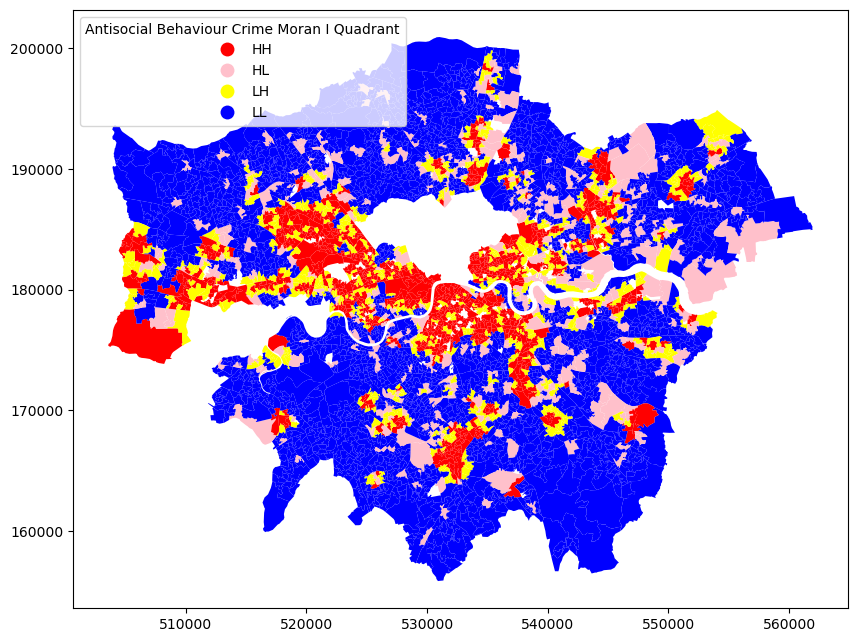

In [117]:
fig, ax = plt.subplots(1, figsize=(10,8))

qcolors = {'HH':'red', 'HL':'pink', 'LH':'yellow', 'LL':'blue'}

#map
gdf.plot(column='quadrant', categorical=True, cmap=colors.ListedColormap(qcolors.values()),
         k=2, edgecolor='white', linewidth=0.0,
         legend=True, legend_kwds={"title":'Antisocial Behaviour Crime Moran I Quadrant',"loc": 2},
         ax=ax)

### Moran I for violent crime

In [118]:
gdf['vcrime_rat_lag'] = weights.spatial_lag.lag_spatial(w, gdf['vcrime_rat'])

In [119]:
def standardize(df, var):
    name = var + '_z'
    df[name] = (df[var] - df[var].mean()) / df[var].std()

standardize(gdf,'vcrime_rat')
standardize(gdf,'vcrime_rat_lag')

In [120]:
def rules(row):
    if row['vcrime_rat_z'] > 0:
        if row['vcrime_rat_lag_z'] > 0:
            return 'HH'
        else:
            return 'HL'
    else:
        if row['vcrime_rat_lag_z'] > 0:
            return 'LH'
        else:
            return 'LL'

gdf['quadrant'] = gdf.apply(rules, 1)

<AxesSubplot: >

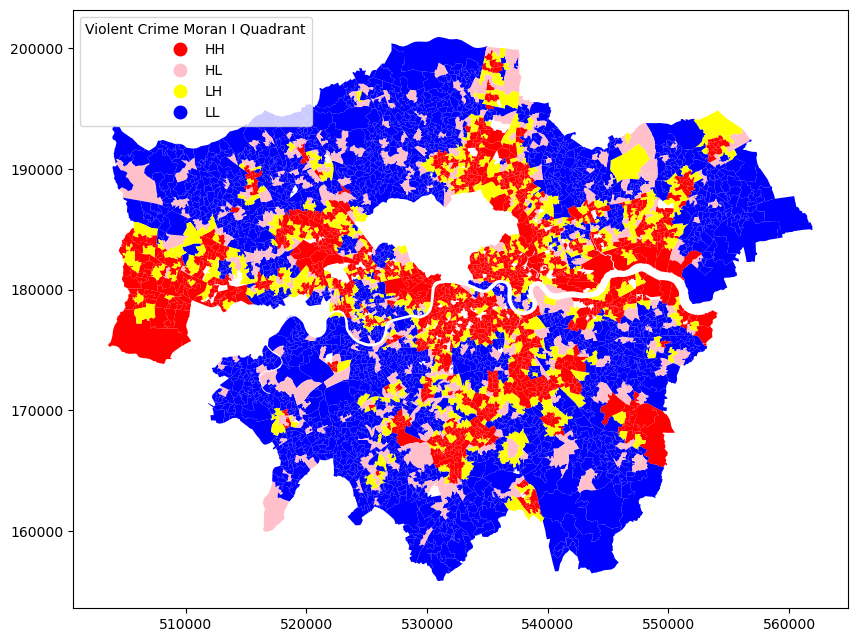

In [121]:
fig, ax = plt.subplots(1, figsize=(10,8))

qcolors = {'HH':'red', 'HL':'pink', 'LH':'yellow', 'LL':'blue'}

#map
gdf.plot(column='quadrant', categorical=True, cmap=colors.ListedColormap(qcolors.values()),
         k=2, edgecolor='white', linewidth=0.0,
         legend=True, legend_kwds={"title":'Violent Crime Moran I Quadrant',"loc": 2},
         ax=ax)

### Local Moran's I for property crime rate

In [122]:
lisa = esda.moran.Moran_Local(gdf['pcrime_rat'], w)

In [123]:
gdf['p-sim'] = lisa.p_sim
sig = 1 * (lisa.p_sim < 0.05)
slabels = ['non-sig.', 'significant']
labels = [slabels[i] for i in sig]
gdf['sig'] = labels
gdf[['sig','p-sim']].head(10)


,sig,p-sim
0,non-sig.,0.110
1,non-sig.,0.192
2,non-sig.,0.136
3,non-sig.,0.222
4,non-sig.,0.115
5,non-sig.,0.394
6,non-sig.,0.392
7,non-sig.,0.429
8,non-sig.,0.250
9,non-sig.,0.402


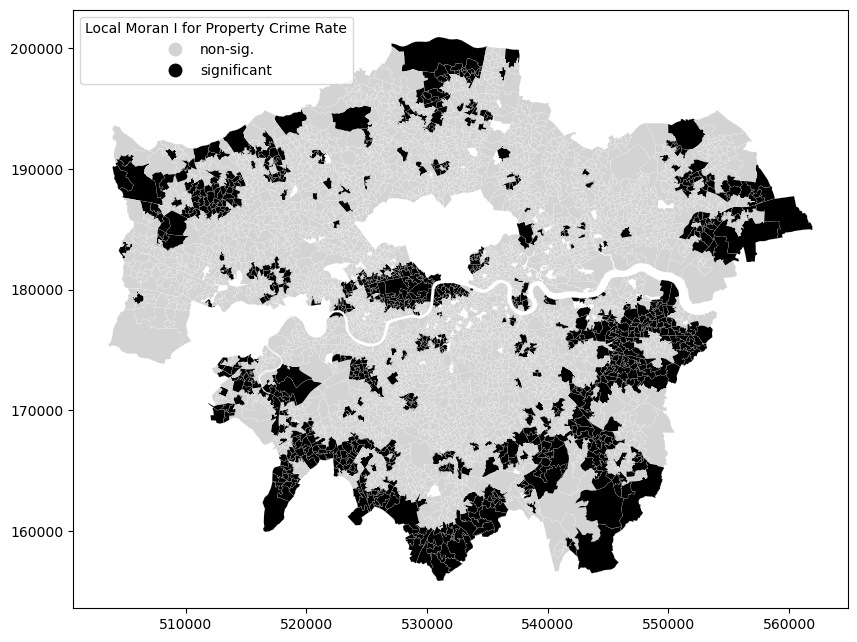

In [124]:
fig, ax = plt.subplots(1,figsize=(10,8))
sigcolors = {'non-sig.':'lightgrey', 'significant':'black'}
gdf.plot(column='sig', categorical=True, cmap=colors.ListedColormap(sigcolors.values()),
k=2, linewidth=0.1, edgecolor='white',
legend=True, legend_kwds={"title":'Local Moran I for Property Crime Rate',"loc": 2},
ax=ax)
plt.show()


In [125]:
lisa.q[1:10]

array([2, 1, 1, 2, 3, 4, 3, 2, 3])

In [126]:
counts = [(j,(lisa.q==j).sum()) for j in range(1,5)]
counts

[(1, 443), (2, 625), (3, 2577), (4, 534)]

In [127]:
qlabels = ['HH', 'LH', 'LL', 'HL'] #pysal scheme is HH=1, LH=2, LL=3, HL=4
labels = [qlabels[i-1] for i in lisa.q] #list substituting 1-4 with HH-HL
labels[1:10]


['LH', 'HH', 'HH', 'LH', 'LL', 'HL', 'LL', 'LH', 'LL']

In [128]:
gdf['qlabels'] = labels
[(qlabel, (gdf['qlabels']==qlabel).sum()) for qlabel in qlabels]


[('HH', 443), ('LH', 625), ('LL', 2577), ('HL', 534)]

In [129]:
hotspot = 1 * (sig * lisa.q==1)
coldspot = 3 * (sig * lisa.q==3)
doughnut = 2 * (sig * lisa.q==2)
diamond = 4 * (sig * lisa.q==4)
spots = hotspot + coldspot + doughnut + diamond

spot_labels = [ '0 non-sig.', '1 HH-sig.', '2 LH-sig.', '3 LL-sig.', '4 HL-sig.']
labels = [spot_labels[i] for i in spots]

In [130]:
gdf['slabels'] = labels
[(spot_label, (gdf['slabels']==spot_label).sum()) for spot_label in spot_labels]

[('0 non-sig.', 3232),
 ('1 HH-sig.', 161),
 ('2 LH-sig.', 93),
 ('3 LL-sig.', 637),
 ('4 HL-sig.', 56)]

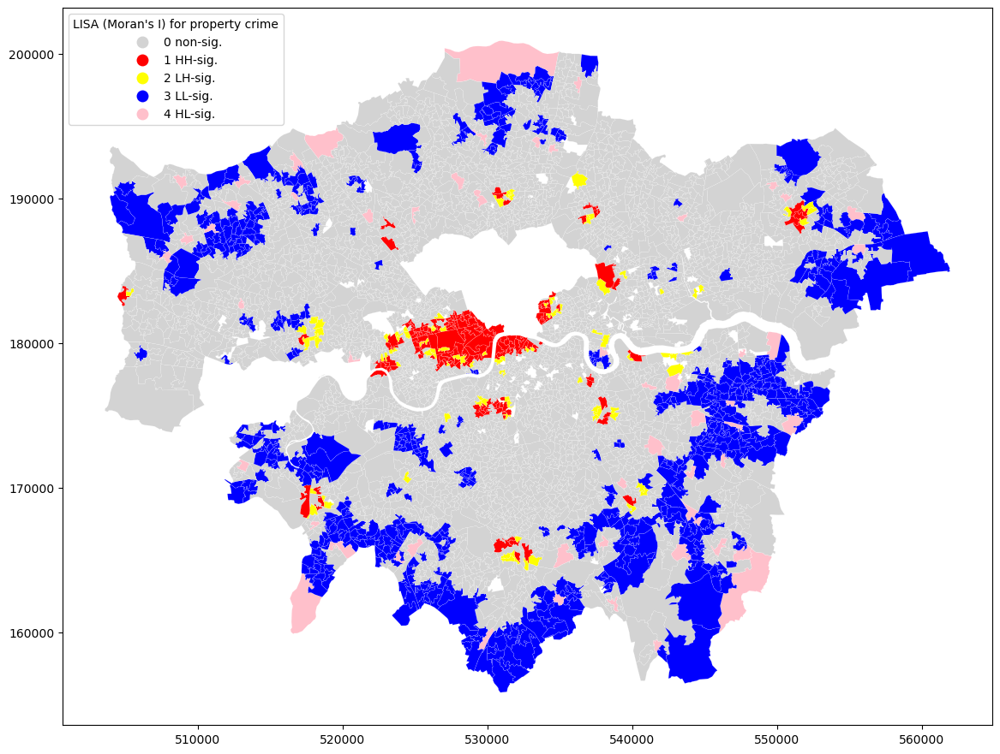

In [131]:
fig, ax = plt.subplots(1, figsize=(14,14))
sigcolors = colors.ListedColormap([ 'lightgrey', 'red', 'yellow', 'blue', 'pink'])
gdf.plot(column='slabels', categorical=True, 
         k=2, cmap=sigcolors, linewidth=0.1, edgecolor='white', 
         legend=True, legend_kwds={"title":"LISA (Moran's I) for property crime","loc": 2}, 
         ax=ax)
plt.show()


### Local Moran's I for violent crime rate

In [132]:
lisa = esda.moran.Moran_Local(gdf['vcrime_rat'], w)

In [133]:
def standardize(df, var):
    name = var + '_z'
    df[name] = (df[var] - df[var].mean()) / df[var].std()

standardize(gdf,'vcrime_rat')
standardize(gdf,'vcrime_rat_lag')

In [134]:
gdf['p-sim'] = lisa.p_sim
sig = 1 * (lisa.p_sim < 0.05)
slabels = ['non-sig.', 'significant']
labels = [slabels[i] for i in sig]
gdf['sig'] = labels
gdf[['sig','p-sim']].head(10)

,sig,p-sim
0,significant,0.032
1,non-sig.,0.083
2,non-sig.,0.083
3,non-sig.,0.063
4,non-sig.,0.054
5,non-sig.,0.200
6,non-sig.,0.114
7,non-sig.,0.114
8,significant,0.034
9,non-sig.,0.087


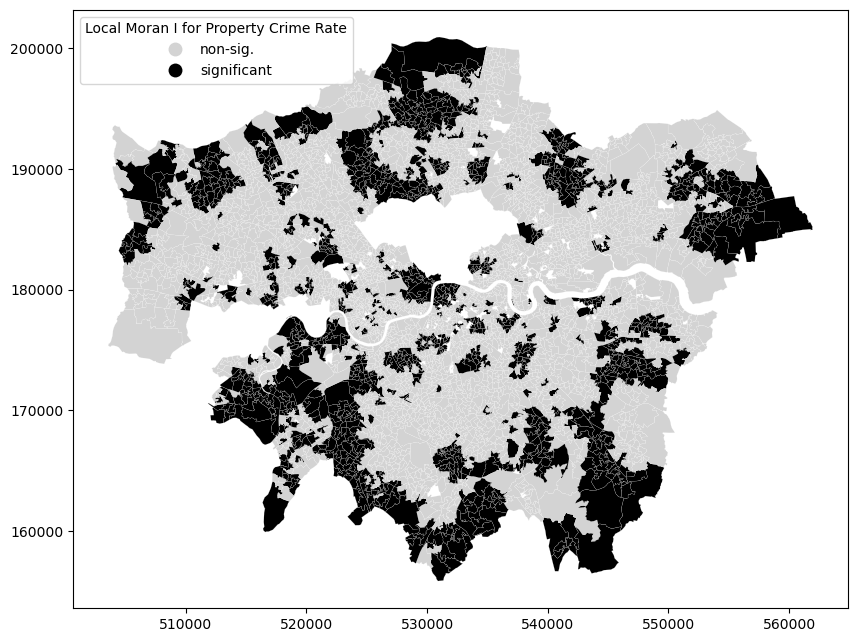

In [135]:
fig, ax = plt.subplots(1,figsize=(10,8))
sigcolors = {'non-sig.':'lightgrey', 'significant':'black'}
gdf.plot(column='sig', categorical=True, cmap=colors.ListedColormap(sigcolors.values()),
k=2, linewidth=0.1, edgecolor='white',
legend=True, legend_kwds={"title":'Local Moran I for Property Crime Rate',"loc": 2},
ax=ax)
plt.show()

In [136]:
lisa.q[1:10]

array([1, 1, 1, 2, 1, 1, 2, 1, 1])

In [137]:
counts = [(j,(lisa.q==j).sum()) for j in range(1,5)]
counts

[(1, 1076), (2, 708), (3, 1904), (4, 491)]

In [138]:
qlabels = ['HH', 'LH', 'LL', 'HL'] #pysal scheme is HH=1, LH=2, LL=3, HL=4
labels = [qlabels[i-1] for i in lisa.q] #list substituting 1-4 with HH-HL
labels[1:10]

['HH', 'HH', 'HH', 'LH', 'HH', 'HH', 'LH', 'HH', 'HH']

In [139]:
gdf['qlabels'] = labels
[(qlabel, (gdf['qlabels']==qlabel).sum()) for qlabel in qlabels]

[('HH', 1076), ('LH', 708), ('LL', 1904), ('HL', 491)]

In [140]:
hotspot = 1 * (sig * lisa.q==1)
coldspot = 3 * (sig * lisa.q==3)
doughnut = 2 * (sig * lisa.q==2)
diamond = 4 * (sig * lisa.q==4)
spots = hotspot + coldspot + doughnut + diamond

spot_labels = [ '0 non-sig.', '1 HH-sig.', '2 LH-sig.', '3 LL-sig.', '4 HL-sig.']
labels = [spot_labels[i] for i in spots]

In [141]:
gdf['slabels'] = labels
[(spot_label, (gdf['slabels']==spot_label).sum()) for spot_label in spot_labels]

[('0 non-sig.', 2947),
 ('1 HH-sig.', 263),
 ('2 LH-sig.', 92),
 ('3 LL-sig.', 792),
 ('4 HL-sig.', 85)]

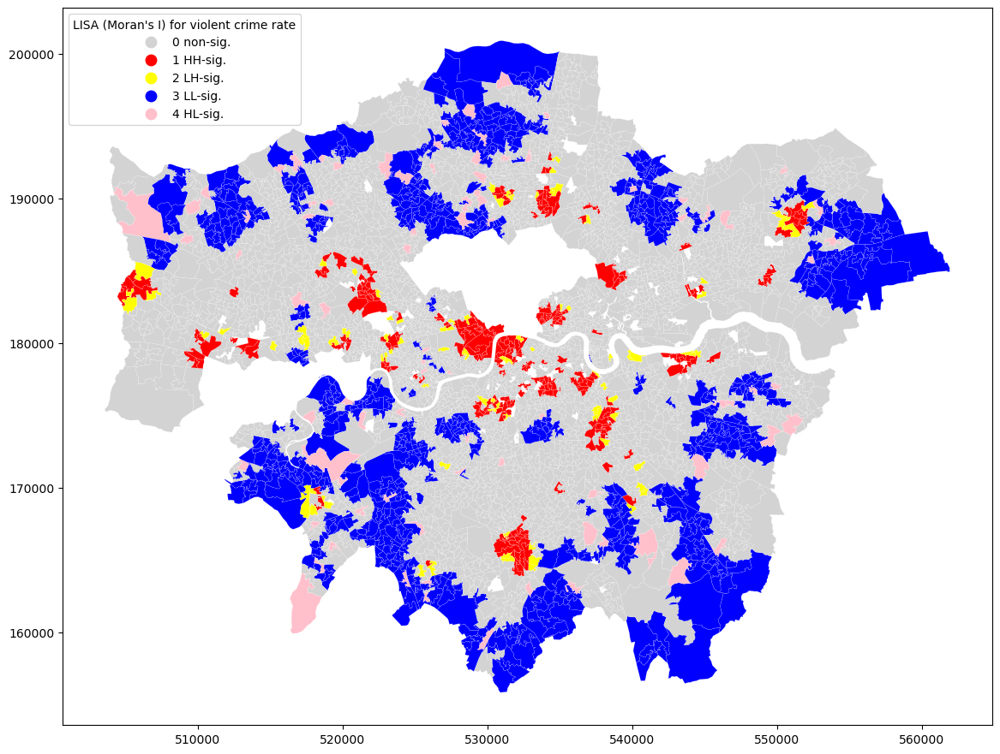

In [142]:
fig, ax = plt.subplots(1, figsize=(14,14))
sigcolors = colors.ListedColormap([ 'lightgrey', 'red', 'yellow', 'blue', 'pink'])
gdf.plot(column='slabels', categorical=True, 
         k=2, cmap=sigcolors, linewidth=0.1, edgecolor='white', 
         legend=True, legend_kwds={"title":"LISA (Moran's I) for violent crime rate","loc": 2}, 
         ax=ax)
plt.show()

### Local Moran's I for antisocial behaviour crime rate

In [143]:
lisa = esda.moran.Moran_Local(gdf['acrime_rat'], w)

In [144]:
def standardize(df, var):
    name = var + '_z'
    df[name] = (df[var] - df[var].mean()) / df[var].std()

standardize(gdf,'vcrime_rat')
standardize(gdf,'vcrime_rat_lag')

In [145]:
gdf['p-sim'] = lisa.p_sim
sig = 1 * (lisa.p_sim < 0.05)
slabels = ['non-sig.', 'significant']
labels = [slabels[i] for i in sig]
gdf['sig'] = labels
gdf[['sig','p-sim']].head(10)

,sig,p-sim
0,significant,0.040
1,non-sig.,0.115
2,non-sig.,0.078
3,significant,0.047
4,significant,0.048
5,non-sig.,0.092
6,non-sig.,0.438
7,non-sig.,0.472
8,non-sig.,0.332
9,non-sig.,0.469


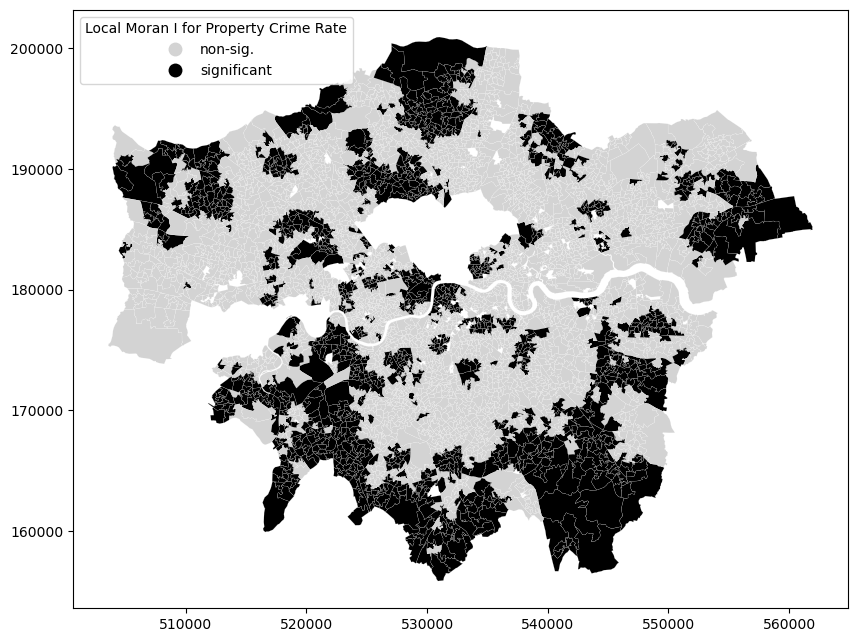

In [146]:
fig, ax = plt.subplots(1,figsize=(10,8))
sigcolors = {'non-sig.':'lightgrey', 'significant':'black'}
gdf.plot(column='sig', categorical=True, cmap=colors.ListedColormap(sigcolors.values()),
k=2, linewidth=0.1, edgecolor='white',
legend=True, legend_kwds={"title":'Local Moran I for Property Crime Rate',"loc": 2},
ax=ax)
plt.show()

In [147]:
lisa.q[1:10]

array([1, 1, 1, 2, 2, 4, 3, 2, 3])

In [148]:
counts = [(j,(lisa.q==j).sum()) for j in range(1,5)]
counts

[(1, 803), (2, 592), (3, 2339), (4, 445)]

In [149]:
qlabels = ['HH', 'LH', 'LL', 'HL'] #pysal scheme is HH=1, LH=2, LL=3, HL=4
labels = [qlabels[i-1] for i in lisa.q] #list substituting 1-4 with HH-HL
labels[1:10]

['HH', 'HH', 'HH', 'LH', 'LH', 'HL', 'LL', 'LH', 'LL']

In [150]:
gdf['qlabels'] = labels
[(qlabel, (gdf['qlabels']==qlabel).sum()) for qlabel in qlabels]

[('HH', 803), ('LH', 592), ('LL', 2339), ('HL', 445)]

In [151]:
hotspot = 1 * (sig * lisa.q==1)
coldspot = 3 * (sig * lisa.q==3)
doughnut = 2 * (sig * lisa.q==2)
diamond = 4 * (sig * lisa.q==4)
spots = hotspot + coldspot + doughnut + diamond

spot_labels = [ '0 non-sig.', '1 HH-sig.', '2 LH-sig.', '3 LL-sig.', '4 HL-sig.']
labels = [spot_labels[i] for i in spots]

In [152]:
gdf['slabels'] = labels
[(spot_label, (gdf['slabels']==spot_label).sum()) for spot_label in spot_labels]

[('0 non-sig.', 2864),
 ('1 HH-sig.', 271),
 ('2 LH-sig.', 84),
 ('3 LL-sig.', 907),
 ('4 HL-sig.', 53)]

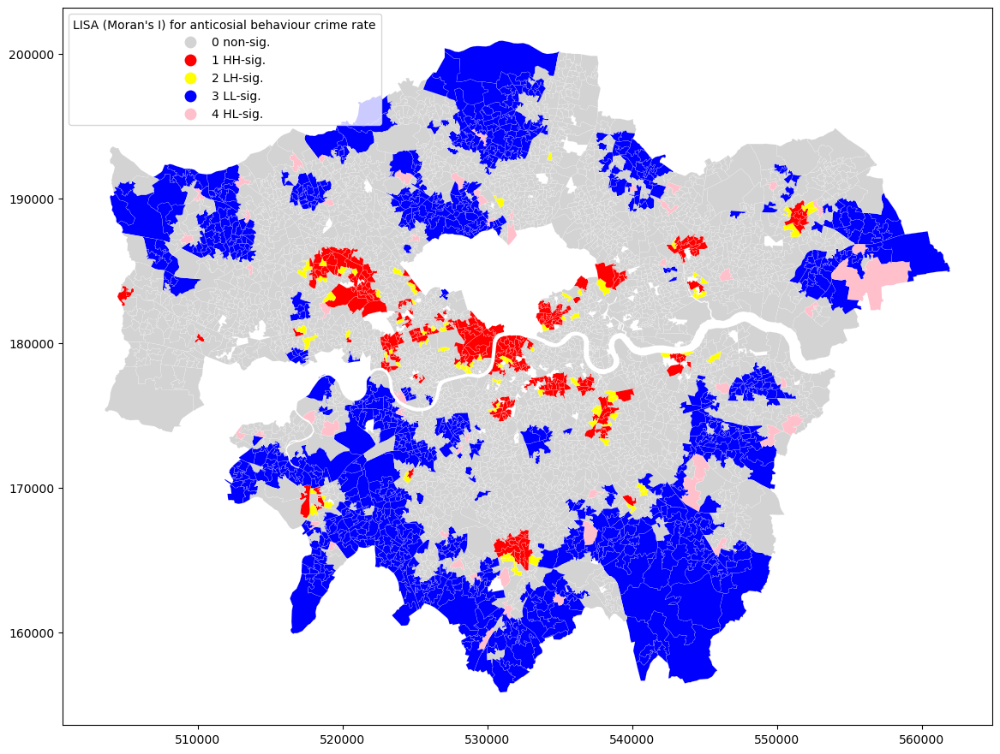

In [153]:
fig, ax = plt.subplots(1, figsize=(14,14))
sigcolors = colors.ListedColormap([ 'lightgrey', 'red', 'yellow', 'blue', 'pink'])
gdf.plot(column='slabels', categorical=True, 
         k=2, cmap=sigcolors, linewidth=0.1, edgecolor='white', 
         legend=True, legend_kwds={"title":"LISA (Moran's I) for anticosial behaviour crime rate","loc": 2}, 
         ax=ax)
plt.show()